# CD8 Depletion scRNA-Seq Analysis
## Author: Sarah Kate Nyquist

Data collected by Hannah Gideon, Kush Patel, and Caylin Winchell under PI's JoAnne Flynn and Lin Ling

And by Marc Wadsworth, Travis Hughes, and Roisin Floyd under PIs Alex Shalek and Bonnie Berger

In [1]:
import scanpy as sc
import anndata
import os
%matplotlib inline
import matplotlib.pylab as plt
import pandas as pd
import numpy as np
import umap
import scrublet as scr
import importlib
import sys
import sys
sys.path.insert(0,"../helper_code")
import plotting_helpers as ph

import seaborn as sns

plt.rcParams["figure.figsize"]=(6,6)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [4]:
print("Scanpy version " + sc.__version__)
print("UMAP version " + umap.__version__)
print("Pandas version " +pd.__version__)
print("Numpy version "+np.__version__)

Scanpy version 1.7.2
UMAP version 0.5.1
Pandas version 1.1.5
Numpy version 1.19.2


In [5]:
def new_adata_from_raw(adata, cluster_values, cluster_key="leiden"):
    adata_0 = anndata.AnnData(adata[adata.obs[cluster_key].isin(cluster_values)].raw.X)
    adata_0.obs_names = adata[adata.obs[cluster_key].isin(cluster_values)].obs_names
    adata_0.var_names = adata[adata.obs[cluster_key].isin(cluster_values)].raw.var_names
    adata_0.obs = adata[adata.obs[cluster_key].isin(cluster_values)].obs
    adata_0.raw = adata_0
    return adata_0
def propegate_labels_up(sub_adata, parent_adata, sub_colname, parent_colname):
    parent_adata.obs[parent_colname]=parent_adata.obs[parent_colname].astype(str)
    
    parent_adata.obs.loc[sub_adata.obs_names, parent_colname] = sub_adata.obs[sub_colname]

# Part 1: Reading data, scrublet analysis, and QC of all samples

In [6]:
updated_meta= pd.read_csv("../../data/sample_metadata.csv", index_col=0)

In [ ]:
# insert path to raw dge files
# download dges from GEO assession number INSERT
dge_path = "../../data/dges" 

In [8]:
filenames = []
for f in os.listdir(dge_path):
    
    
    if "dge.txt.gz" in f:

        filenames.append(f)

Run Scrublet on the samples and save the scrublet umaps and histograms to files

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.39
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 4.3%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 4.3%
Elapsed time: 2.0 seconds
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.42
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 2.4%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 9.7%
Elapsed time: 2.5 seconds
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.42
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 7.0%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 3.8%
Elapsed time: 4.3 seconds
Preprocessing...
Simulating doublets...


/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/scrublet/scrublet.py:473: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 2, figsize = fig_size)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.45
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 0.7%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 50.0%
Elapsed time: 2.5 seconds
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.42
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 1.3%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 10.8%
Elapsed time: 1.9 seconds
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.41
Detected doublet rate = 0.5%
Estimated detectable doublet fraction = 4.8%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 11.0%
Elapsed time: 2.1 seconds
Preprocessing...
Simulating doublets.

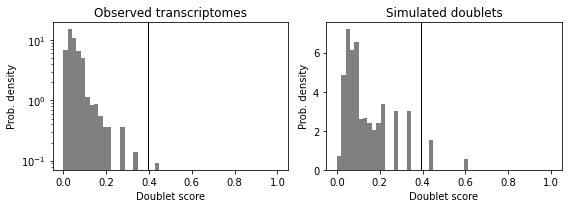

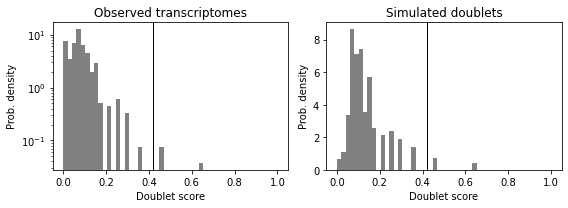

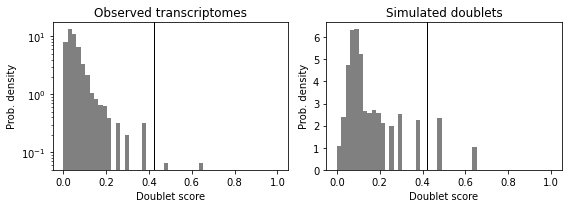

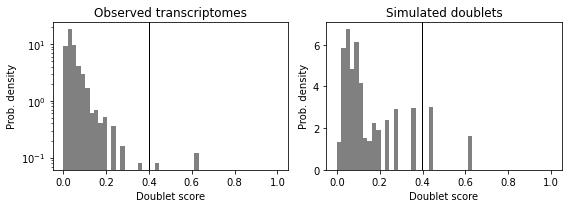

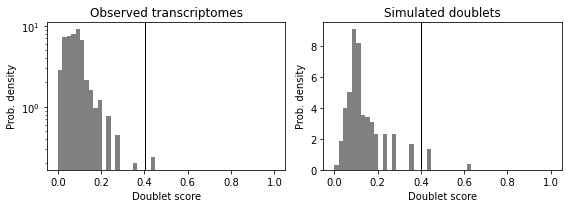

...

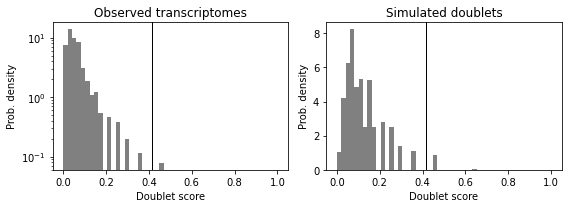

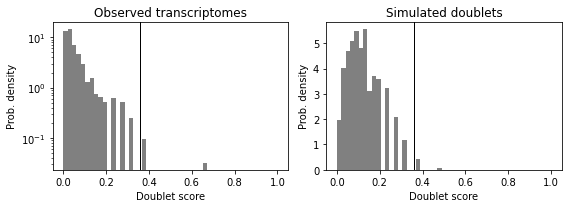

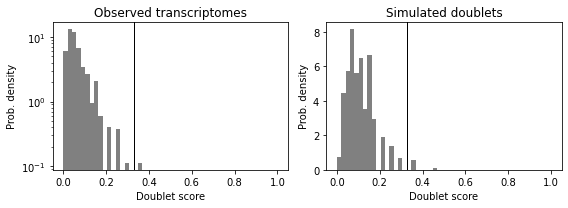

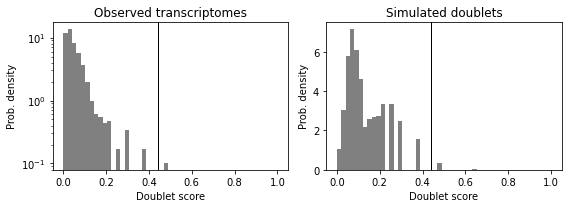

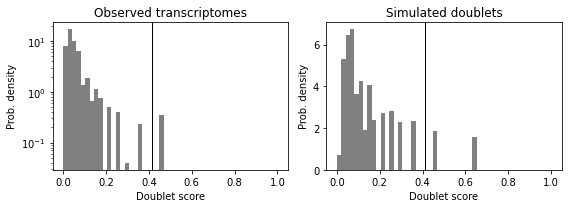

In [20]:
# go through each file, filter cells with summed expression less than 750 and expressing less than 500 genes
all_data = {}
all_cells_doublets = pd.DataFrame(columns=["doublet_scores","predicted_doublet","sample"])

for f in filenames:
    monkey = f.split("_")[0]
    array = f.split("_")[1][5:]
    samplename = "Array"+array+"_"+monkey
    data = pd.read_csv(dge_path+"/"+f, index_col=0, sep="\t").T
    scrub = scr.Scrublet(data, expected_doublet_rate=0.06)
    # these input values are set from the recommended defaults
    doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)
    if not os.path.exists("../../plots/scrublet/"+monkey):
        os.makedirs("../../plots/scrublet/"+monkey)
    
    scrub.plot_histogram()
    plt.savefig("../../plots/scrublet/"+monkey+"/"+samplename+"_histograms.png", bbox_inches='tight')
    data.index = [samplename+"_"+i for i in data.index]
    #scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
    #scrub.plot_embedding('UMAP', order_points=True)
    #plt.savefig("plots/scrublet/"+monkey+"/"+samplename+"_umaps.png", bbox_inches='tight')
    all_cells_doublets_ = pd.DataFrame(columns = ["doublet_scores","predicted_doublet","sample"], index = data.index)
    all_cells_doublets_["doublet_scores"] = doublet_scores
    all_cells_doublets_[ "predicted_doublet"] = predicted_doublets
    all_cells_doublets_["sample"] = samplename
    all_cells_doublets = pd.concat([all_cells_doublets,all_cells_doublets_], sort=True)
    adata = anndata.AnnData(data)
    adata.obs_names = data.index
    adata.var_names = data.columns
    adata.obs["sample"] = samplename
    
    
    all_data[f] = adata

In [639]:
all_adata_list = list(all_data.values())
concat_adata = all_adata_list[0].concatenate([a for a in all_adata_list[1:] if len(a.obs_names) > 100 ], join = 'outer')


In [640]:
concat_adata.obs_names= ["-".join(a.split("-")[:-1]) for a in concat_adata.obs_names]

In [642]:
# when samples are concatenated and genes are not found in some samples, nans are added
# here we replace with zeros
concat_adata.X=np.nan_to_num(concat_adata.X) 

In [29]:
# copy doublet scores and predicted doublets from scrublet into the adata object's metadata
for col in ["doublet_scores","predicted_doublet"]:
    concat_adata.obs[col] = all_cells_doublets.loc[concat_adata.obs_names,col]

In [30]:
sc.pp.calculate_qc_metrics(concat_adata,inplace=True)

In [31]:
# calculate percent mitochondrial genes from the cyno mitochondrial gene list
concat_adata.obs['percent_mito'] = np.sum(
    concat_adata[:, cd8.mito_genes].X, axis=1) / np.sum(concat_adata.X, axis=1)

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [643]:
updated_meta.index = updated_meta["sample name"]

In [644]:
# copy sample-level metadata into adata object
for col in ['M.Number', 'treatment', 'infection dose', 'Tissue name',
       'CFU/granuloma','total thoracic CFU', 'Array','lung region','Gran State','total_cells_elbow']:
    concat_adata.obs[col] = concat_adata.obs["sample"].map(updated_meta[col])

In [645]:
concat_adata.write_h5ad("../../data/analysis_objects/raw_counts_all_cells.h5ad")

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'sample' as categorical
... storing 'treatment' as categorical
... storing 'Tissue name' as categorical
... storing 'lung region' as categorical
... storing 'Gran State' as categorical


In [37]:
# make a metadata column that will allow for plots to automatically sort samples by treatment and monkey
concat_adata.obs["treatment_monkey_array"] = [concat_adata.obs.loc[i,"treatment"]+ "_"+str(concat_adata.obs.loc[i,"M.Number"])+"_"+str(concat_adata.obs.loc[i,"Array"]) for i in concat_adata.obs_names]


In [72]:
os.mkdir("tables")
os.mkdir("tables/metadata")

In [73]:
unfiltered_metadata=concat_adata.obs

unfiltered_metadata.to_csv("tables/metadata/all_cells_unfiltered_metadata.csv")

In [74]:
# quality filter the data for min 750 total counts per cell and min 500 genes per cell
sc.pp.filter_cells(concat_adata, min_counts=750)
sc.pp.filter_cells(concat_adata, min_genes=500)
sc.pp.filter_genes(concat_adata, min_cells=3)



/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [80]:
updated_meta["total_cells_quality_filter"] = concat_adata.obs.groupby(["sample"]).count().loc[updated_meta.index,"batch"]

In [81]:
updated_meta.to_csv("tables/metadata/per_sample_metadata.csv")

In [350]:
updated_meta=pd.read_csv("tables/metadata/per_sample_metadata.csv",index_col=0)

In [82]:
os.mkdir("analysis_objects")

In [83]:
concat_adata.write_h5ad("analysis_objects/all_data_raw_countfiltered.h5ad")

In [255]:
concat_adata=sc.read_h5ad("analysis_objects/all_data_raw_countfiltered.h5ad")

In [84]:
unfiltered_metadata["filtered_out_by_min_counts"] = True
unfiltered_metadata.loc[concat_adata.obs_names,"filtered_out_by_min_counts"] =False 

In [88]:
unfiltered_metadata.to_csv("tables/metadata/all_cells_unfiltered_metadata.csv")

In [5]:
unfiltered_metadata=pd.read_csv("tables/metadata/all_cells_unfiltered_metadata.csv",index_col=0)

## Subset to just Granulomas

In [6]:
gran_adata = concat_adata[concat_adata.obs["Gran State"].isin(["Old","New"])]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [7]:
gran_adata = gran_adata[gran_adata.obs['total_counts'] < 120000, :]
gran_adata = gran_adata[gran_adata.obs['percent_mito'] < 0.15, :]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [8]:

sc.pp.normalize_per_cell(gran_adata, counts_per_cell_after=1e4)
sc.pp.log1p(gran_adata) 
gran_adata.raw = gran_adata

Trying to set attribute `.obs` of view, copying.


In [9]:
gran_adata = gran_adata[gran_adata.obs['n_genes_by_counts'] < 10000, :]
gran_adata = gran_adata[gran_adata.obs['predicted_doublet']=="False",:]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [10]:
sc.pp.filter_genes(gran_adata, min_cells=5)

Trying to set attribute `.var` of view, copying.


In [11]:
gran_adata.obs["M.Number"] = gran_adata.obs["M.Number"].astype("category")
sc.pp.highly_variable_genes(gran_adata, n_top_genes=2300, batch_key="M.Number") 
gran_adata=gran_adata[:,gran_adata.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

In [12]:
gran_adata=sc.pp.scale(gran_adata, max_value=10,copy=True)

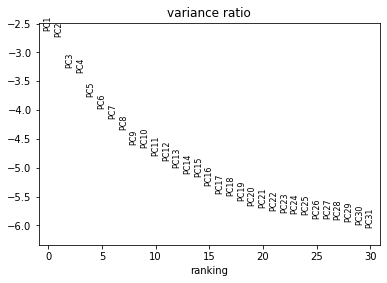

In [13]:
sc.tl.pca(gran_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(gran_adata, log=True)

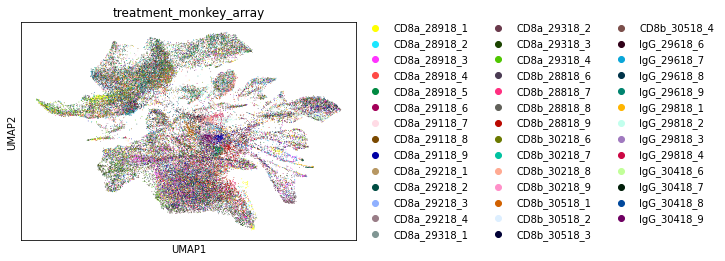

In [14]:
sc.pp.neighbors(gran_adata, n_neighbors=15, n_pcs=28)
sc.tl.umap(gran_adata)
sc.pl.umap(gran_adata, color="treatment_monkey_array")

In [2]:
gran_adata=sc.read_h5ad("tmp_gran_adata.h5ad")

In [3]:
gran_adata=sc.read_h5ad("analysis_objects/all_gran_countfiltered.h5ad")

In [4]:
plt.rcParams["figure.figsize"]=(6,6)


In [15]:
sc.tl.umap(gran_adata)


In [21]:
sc.tl.leiden(gran_adata,resolution=.7)

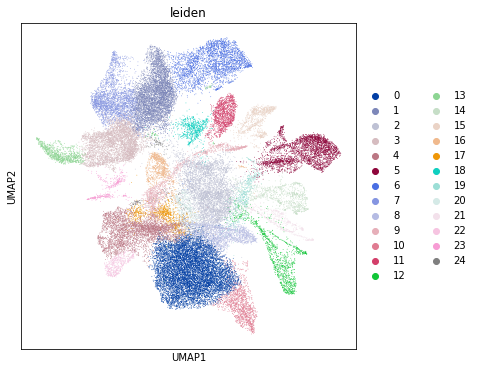

In [367]:
sc.pl.umap(gran_adata, color="leiden",show=False)
plt.savefig("plots/gran_unfiltered_umaps/UMAP_all_cells_by_leiden.png",bbox_inches="tight")
plt.savefig("plots/gran_unfiltered_umaps/UMAP_all_cells_by_leiden.pdf",bbox_inches="tight")

In [368]:
sc.tl.rank_genes_groups(gran_adata,groupby="leiden")

In [26]:
celltypes= {"0":"Mac/Neutrophil/DC","1":"NK/T cells","2":"Mac/Neutrophil/DC","3":"NK/T cells",
           "4":"Mac/Neutrophil/DC","5":"Mast","6":"NK/T cells","7":"NK/T cells","8":"Mac/Neutrophil/DC",
           "9":"Mac/Neutrophil/DC","10":"Mac/Neutrophil/DC","11":"B","12":"NonImmune","13":"NK/T cells",
           "14":"NonImmune","15":"Plasma/B","16":"Mac/Neutrophil/DC","17":"Mac/Neutrophil/DC","18":"B",
           "19":"Mac/Neutrophil/DC","20":"Mac/Neutrophil/DC","21":"NonImmune","22":"Mac/Neutrophil/DC","23":"Mac/Neutrophil/DC",
           "24":"Mac/Neutrophil/DC"}

In [11]:
LOCs={"LOC101925857":"TRAC",
     "LOC102144039":"Mamu-DRA",
     "LOC102122418":"cytochrome b-245 heavy chain",
      "LOC102136468":"Mafa-DPB1",
      "LOC102140945":"FCGR3",
      "LOC102147203":"GBP1"}

In [9]:
clusters_ordered_by_celltype=["0","2","4","8","9","10","16","17","20","22","23","24","19", #mac/neutrophil/dc
                                                                    "5", # mast
                                                                    "1","3","6","7","13",#NK/T
                                                                    "11","18","15", # B + plasma/B
                                                                    "12","14","21"] #nonimmune


In [18]:
import importlib
importlib.reload(fmp)

<module 'figure_making_plots' from '/data/cb/scratch/nyquist/deeper_sequencing_analysis/figure_making_plots.py'>

In [34]:
def clustering_qc_plots_2parts(gran_adata,clusters_ordered_by_celltype,cluster_name,savepath):
    import matplotlib.gridspec as gridspec
    from matplotlib import ticker

    plt.rcParams.update({'font.size': 15})
    # Plot figure with subplots of different sizes
    fig = plt.figure(figsize=(14.7,15))

    # set up subplot grid
    grid=gridspec.GridSpec(1,2, width_ratios=(.8,.8))
    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = grid[0]) # clusters and assignments
    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = grid[1]) # monkeys and samples
    
    ax_leiden = fig.add_subplot(gs1[0, 0])
    sc.pl.umap(gran_adata, color="leiden",show=False,ax=ax_leiden,legend_loc="on data")
    ax_celltypes = fig.add_subplot(gs1[1, 0])
    sc.pl.umap(gran_adata, color=cluster_name,show=False,ax=ax_celltypes,legend_loc="on data")

    ax_monkey = fig.add_subplot(gs2[0, 0])
    sc.pl.umap(gran_adata, color="M.Number",show=False,ax=ax_monkey)
    ax_monkey.get_legend().remove()
    ax_monkey.set_title("Monkey Number")
    ax_sample = fig.add_subplot(gs2[1, 0])
    sc.pl.umap(gran_adata, color="sample",show=False,ax=ax_sample)
    ax_sample.get_legend().remove()
    
    plt.savefig(savepath+".png",bbox_inches="tight")
    
    fig = plt.figure(figsize=(35-14.7,15))
    grid=gridspec.GridSpec(1,2, width_ratios=(1.2,1))
    gs3 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec = grid[0], wspace=1) # marker genes
    gs4 = gridspec.GridSpecFromSubplotSpec(6, 1, subplot_spec = grid[1]) # composition and QC

    ax_mg = fig.add_subplot(gs3[0, 0])
    ax_out=sc.pl.rank_genes_groups_dotplot(gran_adata,groupby="leiden", categories_order=clusters_ordered_by_celltype,groups=clusters_ordered_by_celltype,standard_scale="var",colorbar_title='Standardized mean\nexpression in cluster',
                                    n_genes=3,dendrogram=False,show=False,swap_axes=True,ax=ax_mg)
    ph.replace_rankgenesgroups_dotplot_locs(ax_out)
    ph.qcplots(gran_adata,groupby="leiden",gs4=gs4,fig=fig)
    plt.savefig(savepath+".pdf",bbox_inches="tight")



In [27]:
gran_adata.obs["gran_celltypes"] = gran_adata.obs["leiden"].map(celltypes)

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


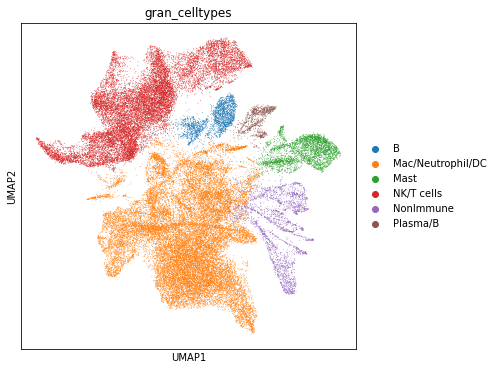

<Figure size 432x432 with 0 Axes>

In [406]:
sc.pl.umap(gran_adata, color="gran_celltypes")
plt.savefig("plots/gran_unfiltered_umaps/UMAP_all_cells_unfiltered_celltype.png",bbox_inches="tight")
plt.savefig("plots/gran_unfiltered_umaps/UMAP_all_cells_unfiltered_celltype.pdf",bbox_inches="tight")


In [527]:
gran_adata.write_h5ad("analysis_objects/all_gran_countfiltered.h5ad")

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


# Subclustering and filtering low quality on NK/T cells

In [46]:
t_adata = new_adata_from_raw(gran_adata, ["NK/T cells"],cluster_key="gran_celltypes")


/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [47]:

t_adata.raw = t_adata

In [48]:
sc.pp.highly_variable_genes(t_adata, n_top_genes=2000, batch_key="M.Number")
t_adata=t_adata[:,t_adata.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

In [50]:
t_adata=sc.pp.scale(t_adata, max_value=10,copy=True)

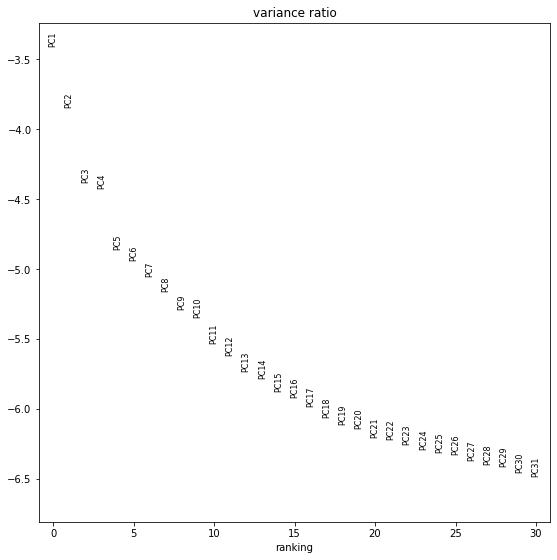

In [51]:
sc.tl.pca(t_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(t_adata, log=True)

In [52]:
sc.pp.neighbors(t_adata, n_neighbors=10, n_pcs=27)

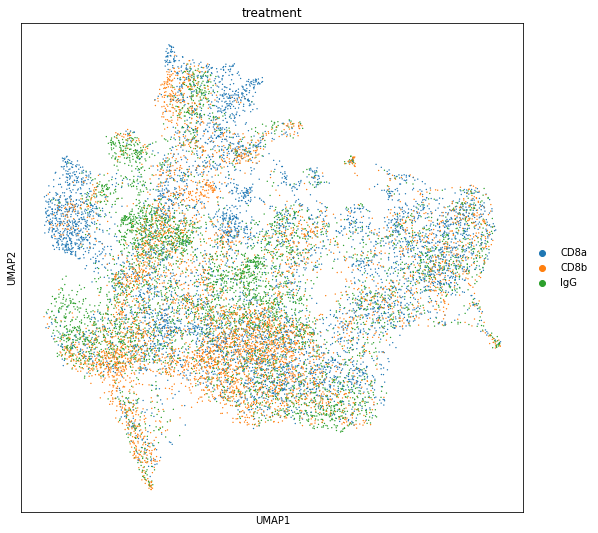

In [53]:
sc.tl.umap(t_adata)
sc.pl.umap(t_adata, color="treatment")

In [54]:
sc.tl.leiden(t_adata, resolution=1.0)

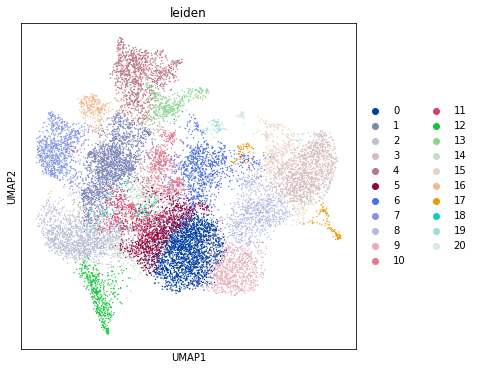

<Figure size 432x432 with 0 Axes>

In [409]:
sc.pl.umap(t_adata, color="leiden")
plt.savefig("plots/gran_unfiltered_umaps/UMAP_tnk_cells_by_leiden.png",bbox_inches="tight")
plt.savefig("plots/gran_unfiltered_umaps/UMAP_tnk_cells_by_leiden.pdf",bbox_inches="tight")

In [57]:
sc.tl.rank_genes_groups(t_adata, groupby="leiden", method="wilcoxon")

In [58]:
pd.DataFrame(t_adata.uns["rank_genes_groups"]["names"]).head()

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,FURIN,GZMK,RPS14,MKI67,GZMH,IL7R,LOC102144039,AHNAK,MCM4,IL2RA,...,LOC102137002,TIGIT,TYROBP,SLC2A3,STMN1,TCF7,LYN,MX1,HBB,CXCR5
1,S100A4,CST7,TCF7,HMGB2,GNLY,SATB1,LYZ,KLF3,MCM3,NFKBIA,...,GIMAP7,FOXP3,LAT2,TOB1,MKI67,IRS2,IFI30,IFI6,LOC102136192,GNB2L1
2,SH3BGRL3,FAM46C,TMEM123,TOP2A,CCL5,RORA,APOE,S100A10,MCM6,BHLHE40,...,PNISR,IKZF2,KLRC1,IL7R,TUBB,CD7,MKI67,HERC6,LOC102136846,NAP1L1
3,RORA,ETS1,RPS16,STMN1,LOC102140945,CCR6,CD74,CLEC12A,MCM5,CTLA4,...,LOC107128653,DUSP4,SYK,GPR183,HMGB2,LAT2,STMN1,MX2,ALAS2,TMEM155
4,IL7R,LOC102136468,RPL13,KIF11,KLRD1,G3BP2,CTSB,TGFBR3,MCM7,RBPJ,...,rna76578,DUSP16,KLRB1,BTG1,TMPO,LOC102128672,TUBB,ISG15,CA1,PRDM8


In [792]:
clusters = {"0":"NK/T","1":"NK/T","2":"NK/T","3":"Proliferating T","4":"NK/T","5":"NK/T",
           "6":"Doublets","7":"NK/T","8":"Proliferating T","9":"NK/T","10":"NK/T",
           "11":"NK/T","12":"NK/T","13":"NK/T","14":"NK/T","15":"Proliferating T",
           "16":"NK/T","17":"B","18":"NK/T","19":"Doublets","20":"NK/T"}

t_adata.obs["NK/T clusters"] = t_adata.obs["leiden"].map(clusters)

In [793]:
sc.tl.rank_genes_groups(t_adata,groupby="leiden")

... storing 'NK/T clusters' as categorical


In [488]:
pd.DataFrame(t_adata.uns["rank_genes_groups"]["names"]).head(3)

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,FURIN,GZMK,RPS14,MKI67,GZMH,IL7R,LOC102144039,GZMB,MCM4,BHLHE40,...,LOC102137002,TIGIT,TYROBP,FAM46C,STMN1,TCF7,MKI67,MX1,HBB,GNB2L1
1,S100A4,FAM46C,TCF7,STMN1,CCL5,SPOCK2,CD74,AHNAK,MCM6,IL2RA,...,GIMAP7,IKZF2,LAT2,BTG1,MKI67,LOC102128672,STMN1,IFI6,LOC102136846,GPR183
2,LOC101925857,CST7,TMEM123,HMGB2,GZMB,SATB1,LYZ,KLF3,MCM3,NFKBIA,...,PNISR,FOXP3,LOC102115168,TNFAIP3,TUBB,CD7,LYN,STAT1,LOC102136192,CXCR5


In [12]:
loc_adds = {"LOC102115168":"TRDC",
           "LOC102128672":"TRGC2",
           "LOC102136846":"HBA1/2/3",
           "LOC102136192":"HBA1/2/3-like"}
LOCs.update(loc_adds)

In [36]:
t_adata = sc.read_h5ad("analysis_objects/t_adata_unfiltered.h5ad")

In [37]:
t_adata.obs["M.Number"]= t_adata.obs["M.Number"].astype(str)

In [38]:
fmp.correct_all_adata_colors(t_adata)

In [22]:
importlib.reload(fmp)

<module 'figure_making_plots' from '/data/cb/scratch/nyquist/deeper_sequencing_analysis/figure_making_plots.py'>

In [39]:
clusters_ordered_by_celltype=["0","1","2","4","5","7","9","10","11","12","13","14",
                              "16","18","20", #NK/T
                             "3","8","15", #proliferating t
                             "6","19",#doublets
                              "17"]#b cells 
#fmp.clustering_qc_plots(t_adata,clusters_ordered_by_celltype,"NK/T clusters")

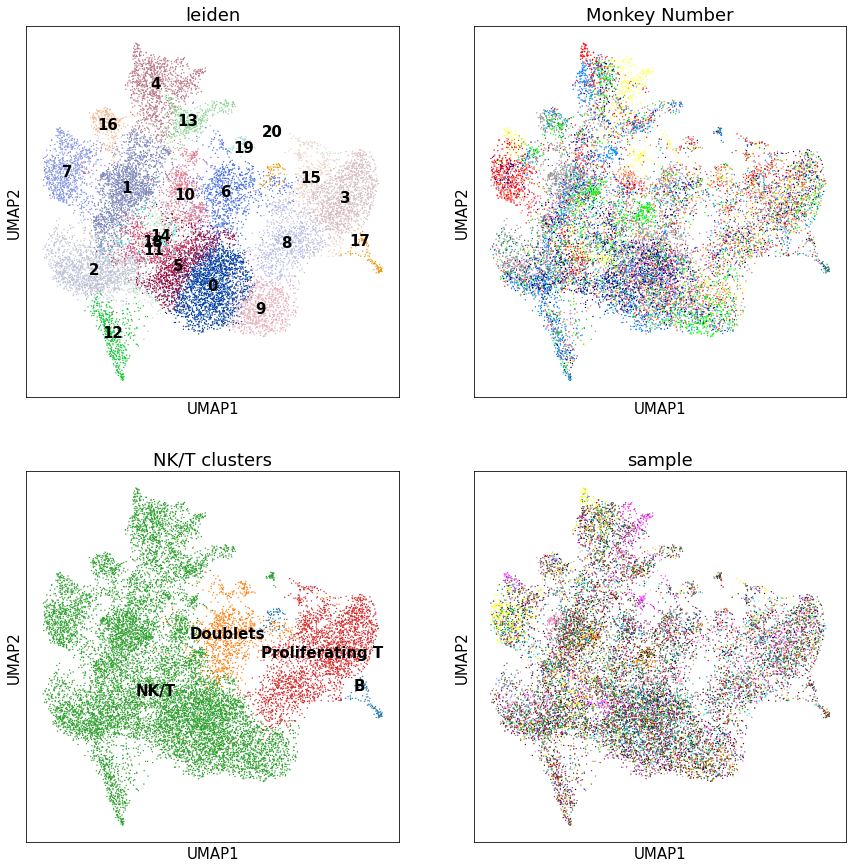

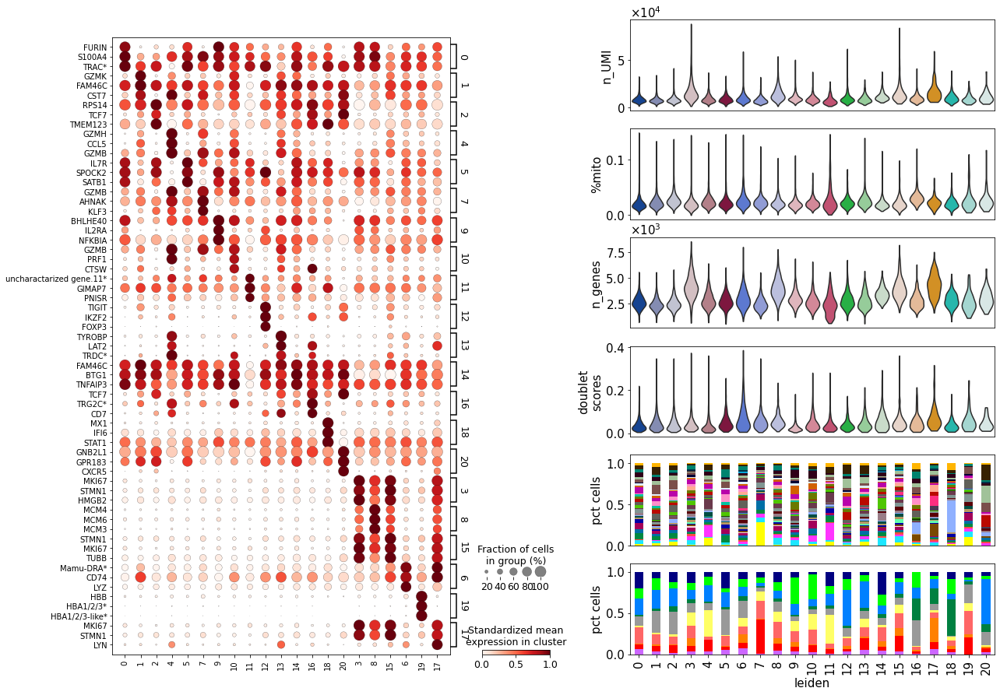

In [40]:
t_adata.obs["M.Number"]= t_adata.obs["M.Number"].astype(str)
fmp.correct_all_adata_colors(t_adata)
clustering_qc_plots_2parts(t_adata,clusters_ordered_by_celltype,"NK/T clusters","plots/gran_unfiltered_umaps/tnk_cells_unfiltered_clustering_QC_plots_2parts")

In [795]:
t_adata.write_h5ad("analysis_objects/t_adata_unfiltered.h5ad")

In [529]:
t_adata.write_h5ad("analysis_objects/t_adata_unfiltered.h5ad")

In [796]:
#gran_adata.obs["nodub subclusters"]=""
propegate_labels_up(t_adata, gran_adata, "NK/T clusters", "nodub subclusters")

In [40]:
gran_adata.obs.loc[t_adata[t_adata.obs["NK/T clusters"]=="B"].obs_names, 
                   "gran_celltypes"] = "B"

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


### Subcluster NK/T with these doublets removed

In [74]:
t_adata_nodub = new_adata_from_raw(t_adata, ["NK/T","Proliferating T"],
                                   cluster_key="NK/T clusters")


/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [41]:
t_adata_nodub=sc.read_h5ad("analysis_objects/nkt_nodoublets.h5ad")

In [75]:

t_adata_nodub.raw = t_adata_nodub

In [76]:
sc.pp.highly_variable_genes(t_adata_nodub, n_top_genes=2000, batch_key="M.Number")
t_adata_nodub=t_adata_nodub[:,t_adata_nodub.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

In [77]:
t_adata_nodub=sc.pp.scale(t_adata_nodub, max_value=10,copy=True)

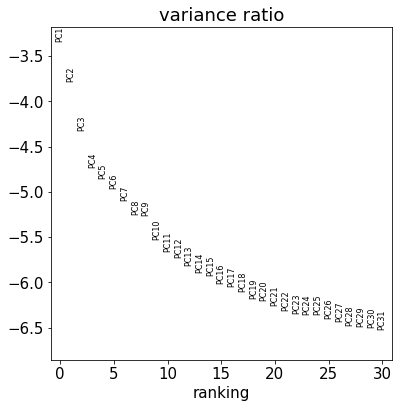

In [78]:
sc.tl.pca(t_adata_nodub, svd_solver='arpack')
sc.pl.pca_variance_ratio(t_adata_nodub, log=True)

In [79]:
sc.pp.neighbors(t_adata_nodub, n_neighbors=10, n_pcs=27)

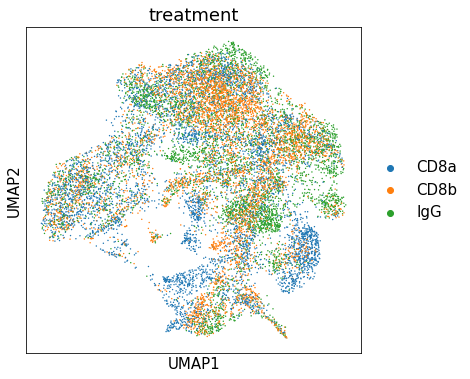

In [80]:
sc.tl.umap(t_adata_nodub)
sc.pl.umap(t_adata_nodub, color="treatment")

In [83]:
sc.tl.leiden(t_adata_nodub, resolution=.7)

In [78]:
sc.tl.rank_genes_groups(t_adata_nodub, groupby="leiden", method="wilcoxon")

In [79]:
pd.DataFrame(t_adata_nodub.uns["rank_genes_groups"]["names"]).head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,IL7R,GZMK,RPS14,MKI67,BHLHE40,GZMH,ITM2C,AHNAK,MCM4,LOC102137002,TIGIT,TYROBP,TCF7,MX1,KLRC1,STMN1,CXCR5
1,RORA,CST7,TCF7,HMGB2,IL2RA,GNLY,GZMK,KLF3,MCM3,GIMAP7,FOXP3,LAT2,LAT2,IFI6,LOC107129205,TUBB,GNB2L1
2,FURIN,FAM46C,TMEM123,TOP2A,NFKBIA,CCL5,GZMB,S100A10,MCM6,SLAMF1,IKZF2,KLRC1,CD7,MX2,LOC102115168,TUBA1B,NAP1L1
3,SATB1,LOC102136468,RPL13,STMN1,NFKBIZ,LOC102140945,PRF1,CLEC12A,MCM5,ZCCHC6,DUSP4,SYK,IRS2,ISG15,THY1,MKI67,MTSS1
4,LOC101925857,CD74,RPL10A,TUBB,FURIN,KLRD1,GPR65,TGFBR3,MCM7,PLCG1,BATF,FCER1G,LOC102128672,HERC6,PRF1,KIF11,PRDM8


In [85]:
clusters = {"0":"T1T17","1":"Cytotoxic T/NK","2":"Stem-like","3":"Proliferating T","4":"T1T17","5":"Cytotoxic T/NK",
           "6":"Cytotoxic T/NK","7":"Cytotoxic T/NK","8":"Proliferating T","9":"T1T17","10":"Treg",
           "11":"Cytotoxic T/NK","12":"Non-cytotoxic CD8","13":"Interferon responding","14":"Cytotoxic T/NK","15":"Proliferating T",
           "16":"Stem-like"}

t_adata_nodub.obs["NK/T clusters"] = t_adata_nodub.obs["leiden"].map(clusters)

In [491]:
sc.tl.rank_genes_groups(t_adata_nodub,groupby="leiden")

In [492]:
pd.DataFrame(t_adata_nodub.uns["rank_genes_groups"]["names"]).head(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,IL7R,GZMK,TCF7,MKI67,BHLHE40,GZMH,TNFAIP3,GZMB,MCM4,LOC102137002,TIGIT,TYROBP,TCF7,IFI6,LOC102115168,STMN1,GNB2L1
1,LOC101925857,CST7,RPS14,STMN1,NFKBIA,CCL5,GZMB,AHNAK,MCM6,SLAMF1,IKZF2,LAT2,LOC102128672,MX1,LOC102128672,MKI67,CXCR5
2,RORA,FAM46C,TMEM123,HMGB2,FURIN,GZMB,GZMK,KLF3,MCM3,ZCCHC6,FOXP3,LOC102115168,CD7,STAT1,KLRC1,TUBB,GPR183


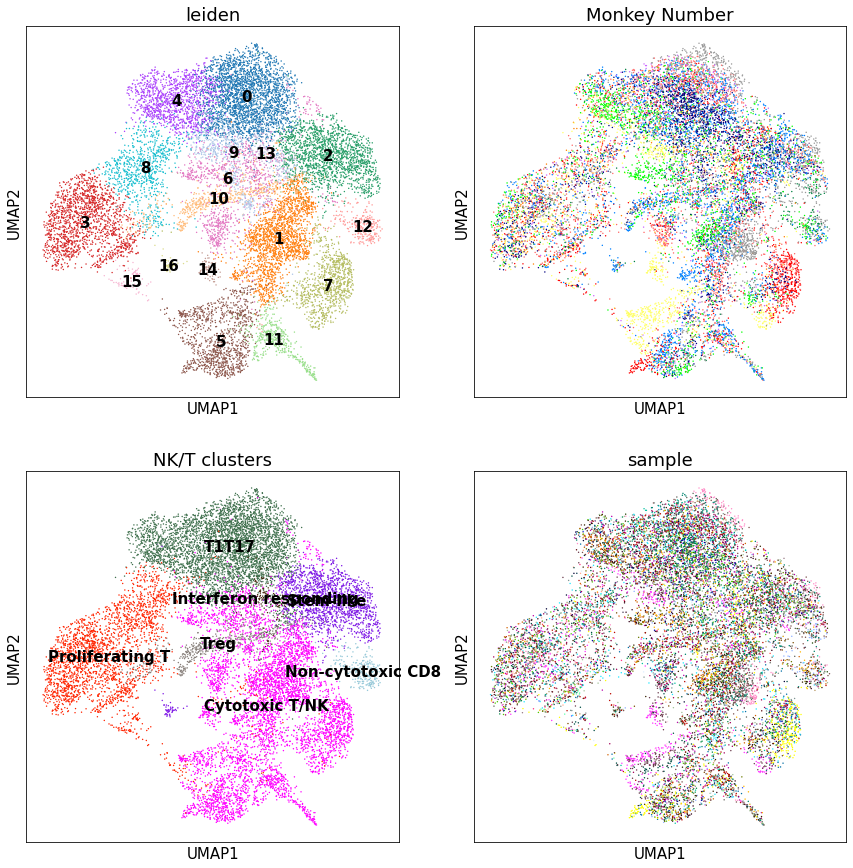

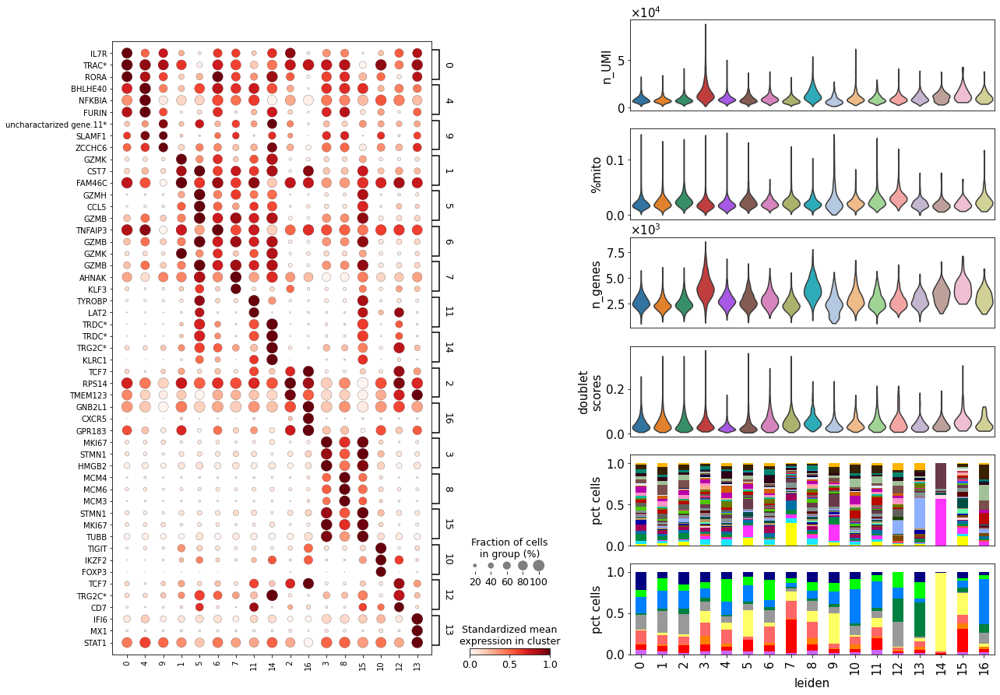

In [50]:
#sc.tl.rank_genes_groups(t_adata_nodub,groupby="leiden")

clusters_ordered_by_celltype=["0","4","9", #T1T17
                             "1","5","6","7","11","14", #cytotoxic t/nk
                             "2","16", #stem-like
                              "3","8", "15",#proliferating t
                              "10", #treg
                              "12", #non-cytotoxic CD8
                              "13"] #interferon responding
         
#t_adata_nodub.obs["M.Number"]= t_adata_nodub.obs["M.Number"].astype(str)
#fmp.correct_all_adata_colors(t_adata_nodub,major_nkt_names=["NK/T clusters"],nkt_subclusters_name=[])
clustering_qc_plots_2parts(t_adata_nodub,clusters_ordered_by_celltype,"NK/T clusters","plots/gran_unfiltered_umaps/tnk_cells_nodoublets_unfiltered_clustering_QC_plots_2parts")

In [19]:
propegate_labels_up(t_adata_nodub, gran_adata, "NK/T clusters", "nodub subclusters")

In [20]:
gran_adata.obs["Subclusters"] = gran_adata.obs["nodub subclusters"]
propegate_labels_up(t_adata_nodub, gran_adata, "NK/T Subclusters", "Subclusters")

### Cytotoxic subclustering

In [87]:
cytotoxic_t = new_adata_from_raw(t_adata_nodub, ["Cytotoxic T/NK"],"NK/T clusters" )

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [88]:
sc.pp.highly_variable_genes(cytotoxic_t, n_top_genes=2000,batch_key="M.Number") # peaked at 256 GB in RAM for finding these genes
cytotoxic_t=cytotoxic_t[:,cytotoxic_t.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

In [89]:
cytotoxic_t=sc.pp.scale(cytotoxic_t, max_value=10,copy=True)

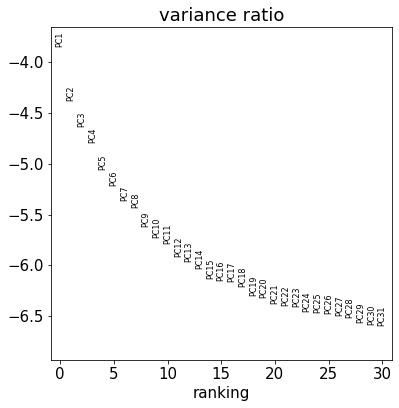

In [90]:
sc.tl.pca(cytotoxic_t, svd_solver='arpack')
sc.pl.pca_variance_ratio(cytotoxic_t, log=True)

In [91]:
sc.pp.neighbors(cytotoxic_t, n_neighbors=12, n_pcs=22)

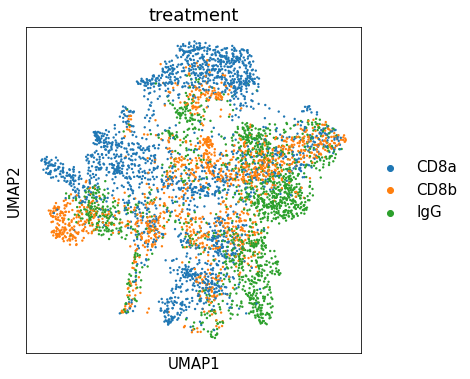

In [92]:
sc.tl.umap(cytotoxic_t)
sc.pl.umap(cytotoxic_t, color="treatment")

In [97]:
t_adata_nodub=sc.read_h5ad("analysis_objects/nkt_nodoublets.h5ad")

In [96]:
sc.tl.rank_genes_groups(cytotoxic_t, groupby="leiden",method="wilcoxon",pts=True)

In [509]:
pd.DataFrame(cytotoxic_t.uns["rank_genes_groups"]["names"]).head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,SPOCK2,AHNAK,GNLY,GZMK,CD28,GZMK,LOC102128672,TYROBP,RORA,CCL5,CD8A,AHNAK,GZMH,MCM4,DST,LOC102140945,LOC102115168
1,CD28,KLF3,GZMH,GPR183,SPOCK2,LOC102142617,CCL5,KLRB1,LOC102128672,LOC102115168,COTL1,TXNIP,GZMB,DNMT1,SPOCK2,TYROBP,LOC102128672
2,LOC101925857,CD6,TYROBP,CXCR4,ICOS,GPR183,LOC102115168,LAT2,LOC102115168,LOC102128672,CD8B,CD4,AHNAK,MCM6,GPR65,CD247,KLRC1
3,FURIN,S100A10,GZMB,PAG1,MAF,LOC102140002,CRTAM,KLRD1,LOC107129205,GZMH,FURIN,CX3CR1,rna76578,STMN1,TNFRSF25,GZMH,LOC107129205
4,IL7R,TGFBR3,LOC102140945,ITM2C,GPR183,CD28,IKZF2,IL2RB,SATB1,LOC102117143,PAG1,S100A4,S100A10,MCM3,RGS2,GZMB,DPP4


In [504]:
update_locs_2 = {"LOC102142617":"HLA1-B14A",
                "LOC102129434":"40S S11",
                "LOC107129205":"TRGV108B"}
LOCs.update(update_locs_2)

In [99]:
clusters = {"0":"T1T17-like Cytotoxic 7","1":"Cytotoxic 6","2":"Cytotoxic 4","3":"Cytotoxic 1","4":"Cytotoxic 2","5":"Cytotoxic 1",
           "6":"Cytotoxic 3","7":"Cytotoxic 4","8":"T1T17-like Cytotoxic 8","9":"Cytotoxic 3","10":"T1T17-like Cytotoxic 7",
           "11":"Cytotoxic 6","12":"Cytotoxic 5","13":"Proliferating T","14":"Cytotoxic 4","15":"Cytotoxic 4",
           "16":"T1T17-like Cytotoxic 8"}
# cluster 5 is dominated by one monkey and the marker genes that make it different from cluster 3 are HLAs, so grouping them both together in GZMK CD8 Cytotoxic

cytotoxic_t.obs["NK/T clusters"] = cytotoxic_t.obs["leiden"].map(clusters)

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'M.Number' as categorical


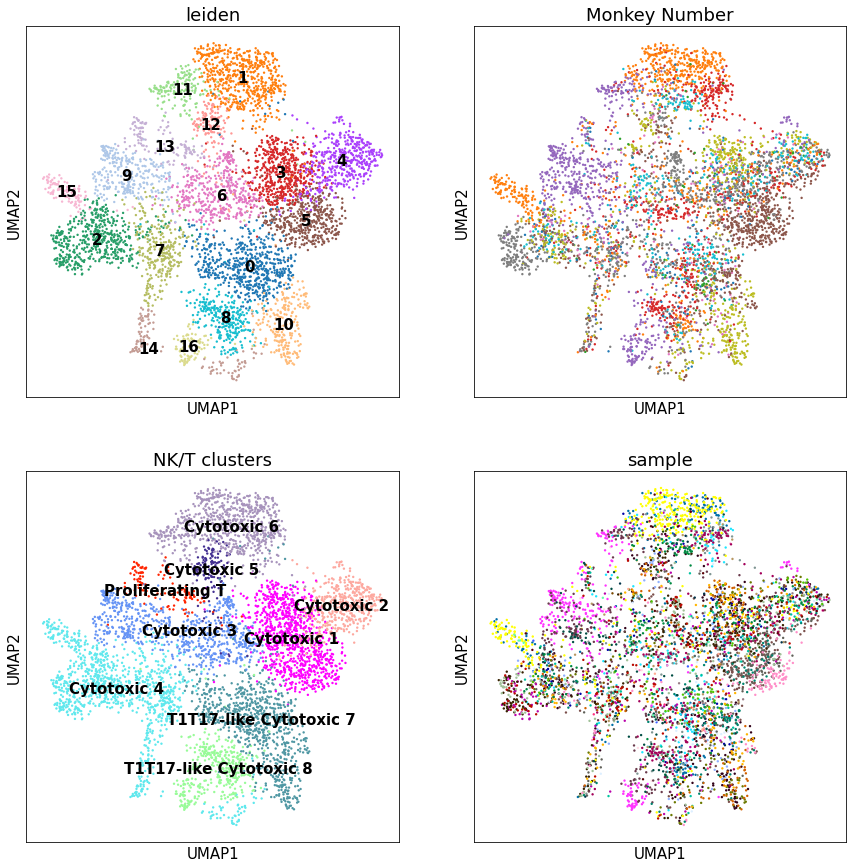

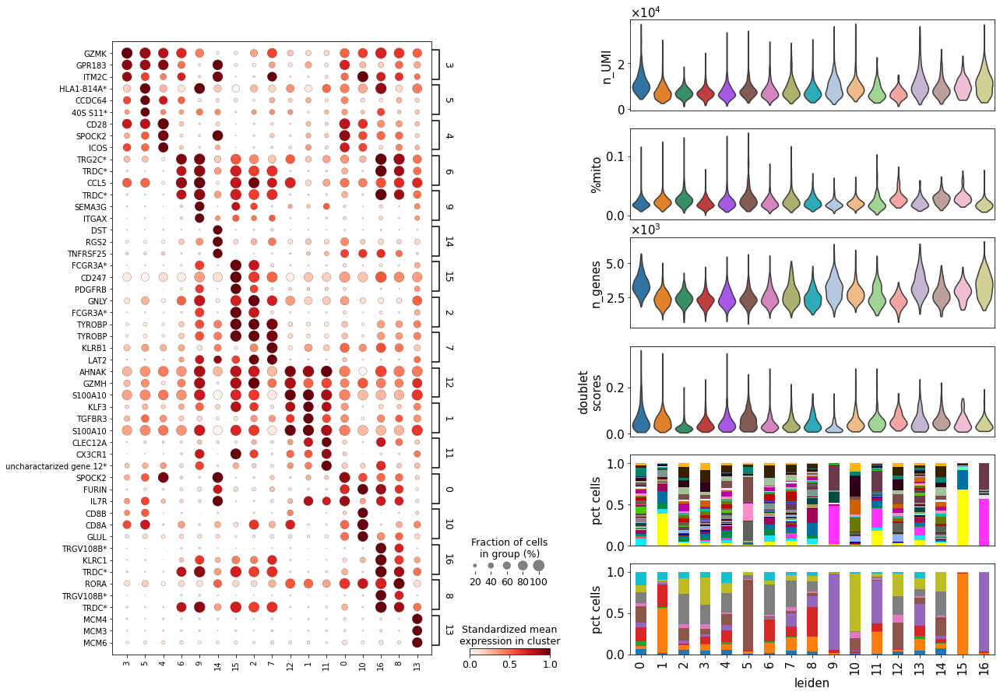

In [106]:

#sc.tl.rank_genes_groups(cytotoxic_t, groupby="leiden",method="wilcoxon",pts=True)
clusters_ordered_by_celltype=["3","5", #1
                             "4", #2
                             "6","9",#3
                             "14","15","2","7", #4
                             "12",#5
                             "1","11",#6
                              "0","10",#7
                             "16","8",#8
                             "13"]#prolif
                              
cytotoxic_t.obs["M.Number"]=cytotoxic_t.obs["M.Number"].astype(str)
color_dict = fmp.colors_from_spreadsheet("NK/T Subclusters",celltype_col="new_name_3",value_col='color')
color_dict_2 = fmp.colors_from_spreadsheet("Major NK/T Clusters",value_col='color')
color_dict.update(color_dict_2)
hh.set_colors_from_dict(cytotoxic_t, color_dict, "NK/T clusters")
#fmp.correct_all_adata_colors(cytotoxic_t,major_nkt_names=[],nkt_subclusters_name=["NK/T clusters"])
#fmp.update_names(cytotoxic_t,nkt_sub_col=["NK/T clusters"],new_col="new_name_3")
clustering_qc_plots_2parts(cytotoxic_t,clusters_ordered_by_celltype,"NK/T clusters","plots/gran_unfiltered_umaps/cytotoxic_tnk_cells_nodoublets_unfiltered_clustering_QC_plots_2parts")

In [103]:
cytotoxic_t.write_h5ad("analysis_objects/cytotoxic_t_adata.h5ad")

In [129]:
t_adata_nodub.obs["NK/T Subclusters"] =t_adata_nodub.obs["NK/T clusters"]
propegate_labels_up( cytotoxic_t,t_adata_nodub, "NK/T clusters", "NK/T Subclusters")

### Subclustering on T proliferating

In [174]:
prolif_t = new_adata_from_raw(t_adata_nodub, ["Proliferating T"],"NK/T clusters" )

In [175]:
sc.pp.highly_variable_genes(prolif_t, n_top_genes=2000, batch_key="M.Number") # peaked at 256 GB in RAM for finding these genes
prolif_t=prolif_t[:,prolif_t.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

In [176]:
prolif_t=sc.pp.scale(prolif_t, max_value=10,copy=True)

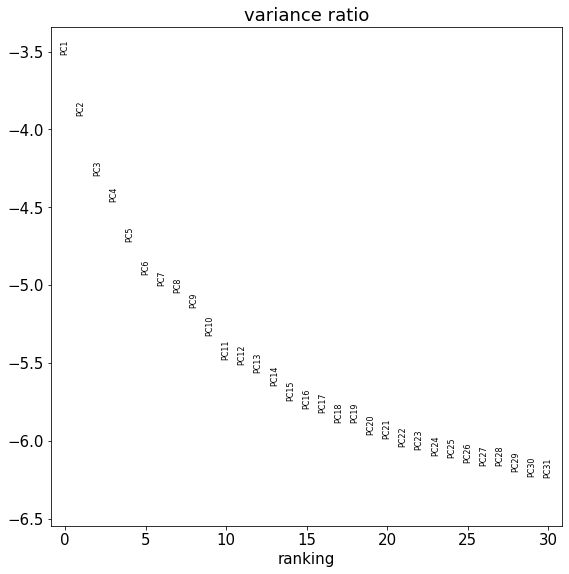

In [177]:
sc.tl.pca(prolif_t, svd_solver='arpack')
sc.pl.pca_variance_ratio(prolif_t, log=True)

In [178]:
sc.pp.neighbors(prolif_t, n_neighbors=10, n_pcs=20)

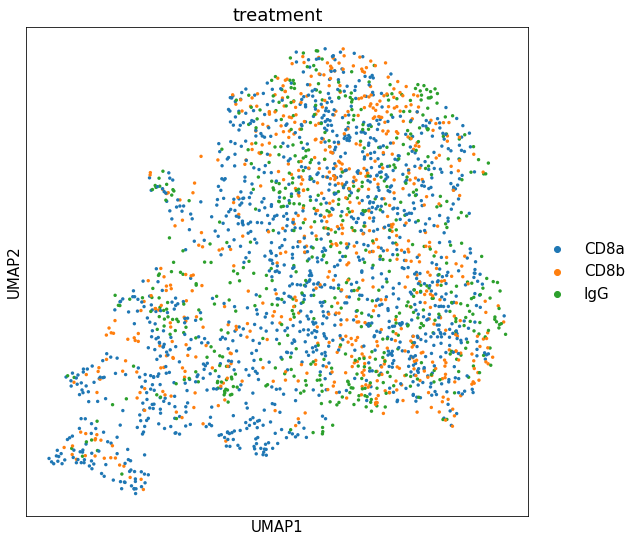

In [179]:
sc.tl.umap(prolif_t)
sc.pl.umap(prolif_t, color=["treatment"])

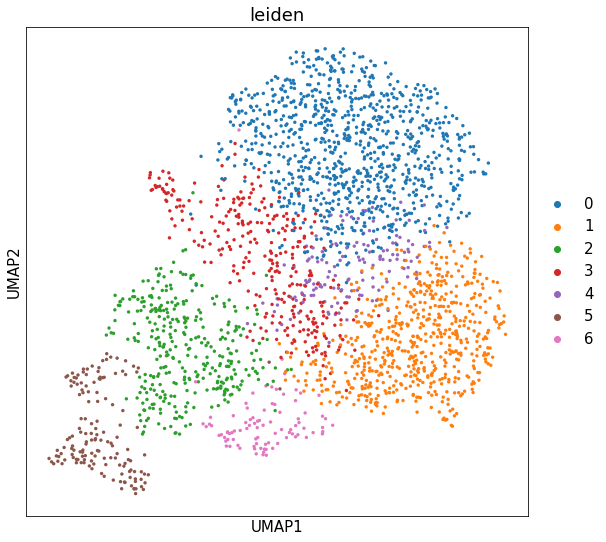

In [180]:
sc.tl.leiden(prolif_t,resolution=.5)
sc.pl.umap(prolif_t,color="leiden")

In [147]:
sc.tl.rank_genes_groups(prolif_t,groupby="leiden",method="wilcoxon")

In [148]:
pd.DataFrame(prolif_t.uns["rank_genes_groups"]["names"]).head(20)

,0,1,2,3,4,5,6
0,TOP2A,MCM4,CST7,RPS2,HSP90AB1,TYROBP,KLRD1
1,ARL6IP1,MCM5,GZMK,LOC102137002,NCL,GZMH,PRF1
2,RAD21,SH3BGRL3,CD27,HMGB1,C1QBP,GNLY,LOC102115168
3,HMGB2,MCM2,CD74,WDR76,RAN,KLRD1,KLRC1
4,CENPF,FURIN,LOC102136468,LOC107128653,NOLC1,CCL5,GZMB
5,CCNA2,S100A4,IKZF3,COX1,RANBP1,LOC102115168,GZMH
6,DLGAP5,MCM6,TIGIT,BRCA2,CCT7,LOC102132533,LOC107129205
7,TPX2,MCM3,TOX,NAP1L1,GNL3,GZMB,CCL5
8,MKI67,ABRACL,CD84,PNN,CCT6A,LAT2,LOC102128672
9,BIRC5,GLUL,FAM46C,TMSB10,LOC101925770,NKG7,CLEC12A


In [181]:
prolif_clusters = {"0":"T1T17 proliferating","1":"T1T17 proliferating",
                  "2":"Cytotoxic proliferating","3":"T1T17 proliferating","4":"T1T17 proliferating","5":"Cytotoxic Innate-like proliferating","6":"Cytotoxic T1T17-like proliferating"}

prolif_t.obs["prolif_subclusters"] = prolif_t.obs["leiden"].map(prolif_clusters)

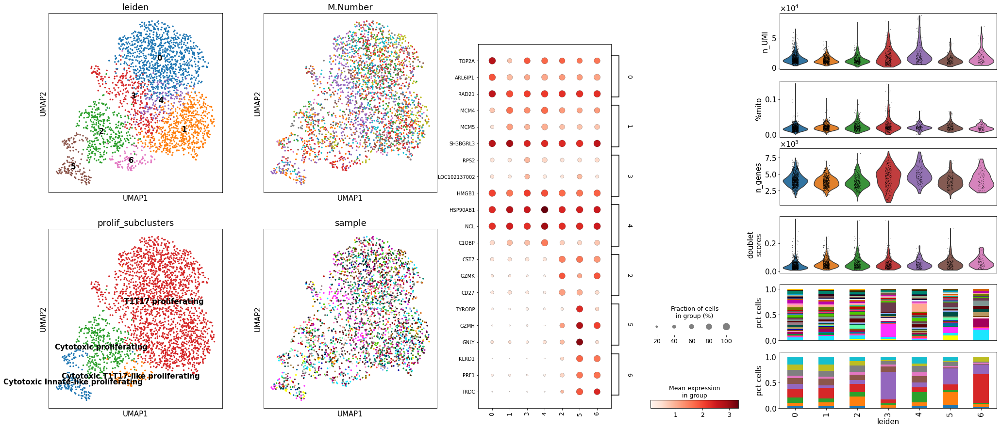

In [511]:
clusters_ordered_by_celltype=["0","1","3","4", #T1T17 proliferating
                             "2", #cytotoxic proliferating
                              "5", #innate-like proliferating
                             "6"] #cytotoxic t1t17 like proliferating
                              
clustering_qc_plots(prolif_t,clusters_ordered_by_celltype,"prolif_subclusters")
plt.savefig("plots/gran_unfiltered_umaps/prolif_tnk_cells_nodoublets_clustering_QC_plots.png",bbox_inches="tight")
plt.savefig("plots/gran_unfiltered_umaps/prolif_tnk_cells_nodoublets_clustering_QC_plots.pdf",bbox_inches="tight")


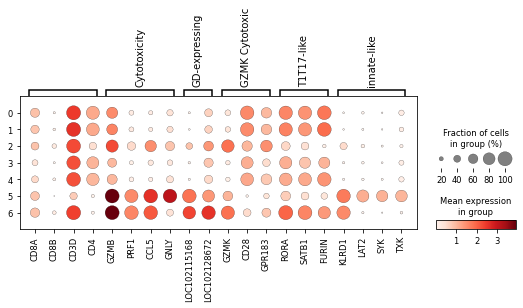

In [149]:
diffgenes = {"":["CD8A","CD8B","CD3D","CD4"],
    "Cytotoxicity":["GZMB","PRF1","CCL5","GNLY"],
             "GD-expressing":["LOC102115168","LOC102128672"],
    "GZMK Cytotoxic":["GZMK","CD28","GPR183"],
             
            "T1T17-like":["RORA","SATB1","FURIN"],
             "innate-like":["KLRD1","LAT2","SYK","TXK"],
            }
sc.pl.dotplot(prolif_t, var_names=diffgenes,groupby="leiden")

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'prolif_subclusters' as categorical


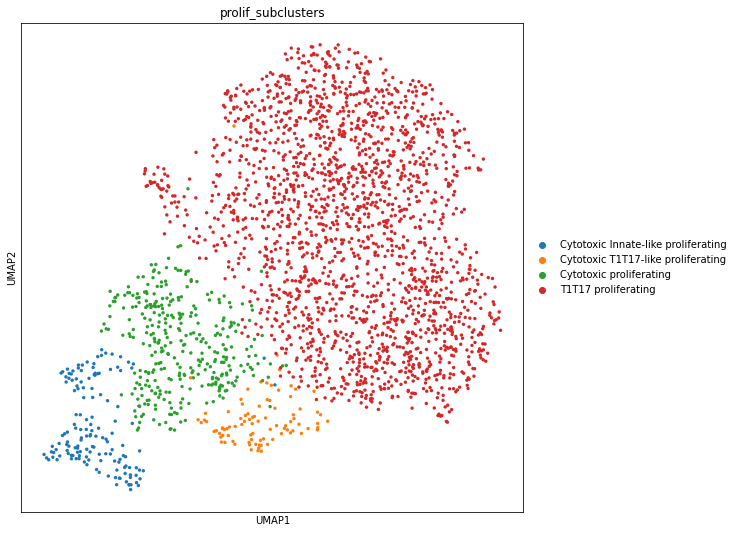

In [151]:
sc.pl.umap(prolif_t, color=["prolif_subclusters"])

In [152]:
t_adata_nodub.obs.loc[prolif_t.obs_names,"prolif subclusts"] = prolif_t.obs["prolif_subclusters"]

In [155]:
propegate_labels_up( prolif_t,t_adata_nodub, "prolif_subclusters", "NK/T Subclusters")

In [182]:
prolif_t.write_h5ad("analysis_objects/proliferating_t_adata.h5ad")

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'prolif_subclusters' as categorical


In [672]:
major_t_meta.to_csv("analysis_objects/major_tnk_celltype_pooled_metadata.csv")

# Myeloid cell subculstering

In [246]:
gran_adata = sc.read_h5ad("analysis_objects/all_gran_countfiltered.h5ad")

In [248]:
gran_adata

AnnData object with n_obs × n_vars = 51448 × 2300
    obs: 'sample', 'batch', 'doublet_scores', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'percent_mito', 'M.Number', 'treatment', 'infection dose', 'Tissue name', 'CFU/granuloma', 'total thoracic CFU', 'Array', 'lung region', 'Gran State', 'total_cells_elbow', 'treatment_monkey_array', 'n_counts', 'n_genes', 'leiden', 'gran_celltypes'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'M.Number_colors', 'gran_celltypes_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'treatment_colors', 'treatment_monkey_arra

In [21]:
mac_adata = new_adata_from_raw(gran_adata, ["Mac/Neutrophil/DC"],cluster_key="gran_celltypes")


/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [22]:
mac_adata.raw = mac_adata
sc.pp.filter_genes(mac_adata,min_cells=5)

In [23]:
sc.pp.highly_variable_genes(mac_adata, n_top_genes=2000, batch_key="M.Number") # peaked at 256 GB in RAM for finding these genes
mac_adata=mac_adata[:,mac_adata.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'nodub subclusters' as categorical
... storing 'Subclusters' as categorical
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_c

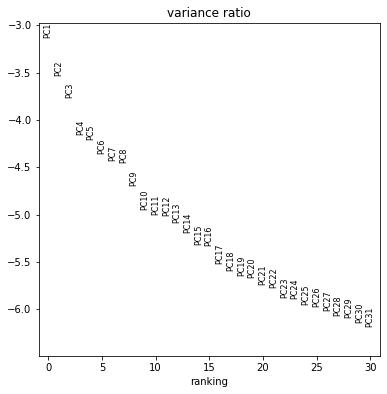

In [252]:
mac_adata=sc.pp.scale(mac_adata, max_value=10,copy=True)
sc.tl.pca(mac_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(mac_adata, log=True)

In [253]:
sc.pp.neighbors(mac_adata, n_neighbors=15, n_pcs=30)

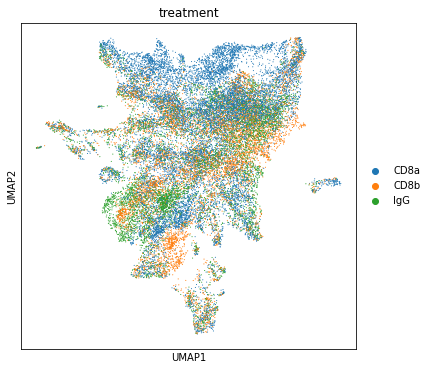

In [254]:
sc.tl.umap(mac_adata)
sc.pl.umap(mac_adata, color="treatment")

In [255]:
sc.tl.leiden(mac_adata, resolution=1)

In [257]:
sc.tl.rank_genes_groups(mac_adata, groupby="leiden")

In [306]:
mac_subtypes = {"0":"Macrophages","1":"Macrophages","2":"Doublets","3":"Macrophages","4":"Macrophages",
               "5":"Macrophages","6":"Macrophages","7":"Macrophages","8":"Macrophages","9":"Doublets",
               "10":"Macrophages","11":"Doublets","12":"Macrophages","13":"Macrophages","14":"cDC","15":"Macrophages",
               "16":"Doublets","17":"Macrophages","18":"pDC","19":"Low Quality","20":"Doublets","21":"Neutrophils","22":"cDC","23":"Macrophages",
               "24":"Doublets","25":"Doublets"}



In [524]:
more_locs = {"LOC102130734":"A2M",
            "LOC102129822":"CYP27A1",
            "LOC102129811":"TREM1",
            "LOC102120967":"LILRB2",
            "LOC102122749":"napsin-A-like"}
LOCs.update(more_locs)

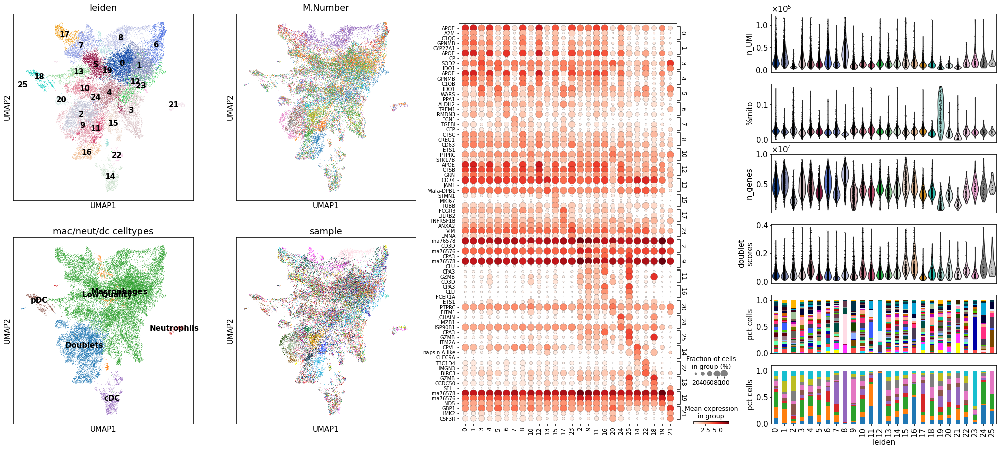

In [525]:
clusters_ordered_by_celltype=["0","1","3","4","5","6","7","8","10","12","13","15","17","23", #macrophages
                             "2","9","11","16","20","24","25", #doublets
                              "14","22", #cDC
                             "18", #pDC
                              "19",#low quality
                             "21"] #Neutrophils
                              
clustering_qc_plots(mac_adata,clusters_ordered_by_celltype,"mac/neut/dc celltypes")
plt.savefig("plots/gran_unfiltered_umaps/mac_dc_neutrophils_cells_unfiltered_clustering_QC_plots.png",bbox_inches="tight")
plt.savefig("plots/gran_unfiltered_umaps/mac_dc_neutrophils_cells_unfiltered_clustering_QC_plots.png",bbox_inches="tight")


In [309]:

propegate_labels_up(mac_adata, gran_adata, "mac/neut/dc celltypes", "nodub subclusters")

In [531]:
mac_adata.write_h5ad("analysis_objects/mac_unfiltered.h5ad")

In [4]:
mac_adata=sc.read_h5ad("analysis_objects/mac_unfiltered.h5ad")

### Just Macrophage subclustering

In [5]:
just_mac_adata = new_adata_from_raw(mac_adata, ["Macrophages","cDC","pDC"],cluster_key="mac/neut/dc celltypes")


/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [6]:
just_mac_adata.raw = just_mac_adata
sc.pp.filter_genes(just_mac_adata,min_cells=5)

In [7]:
sc.pp.highly_variable_genes(just_mac_adata, n_top_genes=2000, batch_key="M.Number") # peaked at 256 GB in RAM for finding these genes
print(just_mac_adata.var[just_mac_adata.var["highly_variable_nbatches"]>3].shape)

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

(1747, 7)


/afs/csail.mit.edu/u/n/nyquist/.local/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [8]:
just_mac_adata=just_mac_adata[:,just_mac_adata.var["highly_variable_nbatches"]>3]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


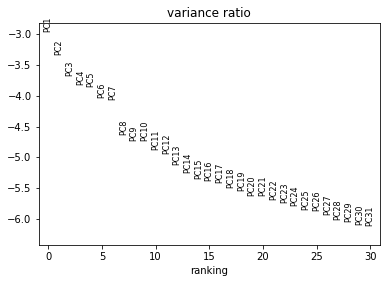

In [9]:
just_mac_adata=sc.pp.scale(just_mac_adata, max_value=10,copy=True)
sc.tl.pca(just_mac_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(just_mac_adata, log=True)

In [10]:
sc.pp.neighbors(just_mac_adata, n_neighbors=15, n_pcs=30)

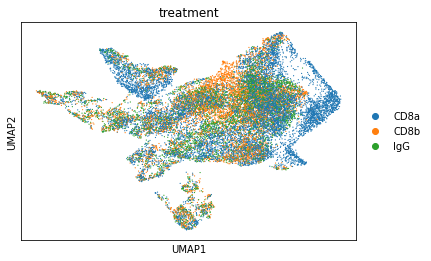

In [11]:
sc.tl.umap(just_mac_adata)
sc.pl.umap(just_mac_adata, color="treatment")

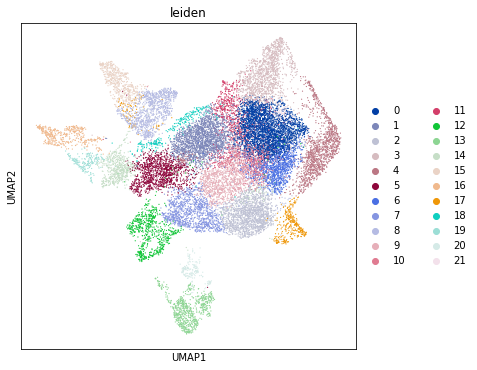

In [33]:
sc.pl.umap(just_mac_adata, color="leiden")

In [63]:
general = {"0":"Mac",
          "1":"Mac",
          "2":"Mono-Mac",
          "3":"Mac",
          "4":"Mac",
          "5":"Mac",
          "6":"Mac",
          "7":"Mono-Mac","8":"Mono",
          "9":"Mono-Mac",
          "10":"Mac",
          "11":"Mac",
          "12":"Prolif Mac",
          "13":"cDC",
          "14":"pDC",
          "15":"Mono",
          "16":"pDC",
          "17":"Mono-Mac",
          "18":"B cell/mac doublets",
          "19":"pDC",
          "20":"pDC",
          "21":"Mac"}
just_mac_adata.obs["mac_subtypes"] = just_mac_adata.obs["leiden"].map(general)

... storing 'mac_subtypes' as categorical


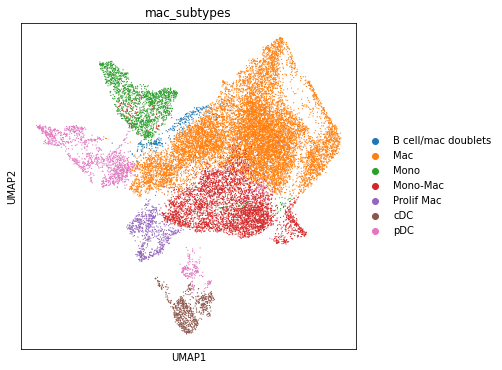

In [64]:
sc.pl.umap(just_mac_adata, color="mac_subtypes")

In [43]:
sc.tl.rank_genes_groups(just_mac_adata, groupby="leiden",pts=True)

In [44]:
sc.tl.filter_rank_genes_groups(just_mac_adata, min_fold_change=1.5)

In [66]:
just_mac_adata.obs["M.Number"]= just_mac_adata.obs["M.Number"].astype(str)

In [238]:
just_mac_adata.write_h5ad("analysis_objects/myeloid_filtered.h5ad")

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'myeloid_clusts' as categorical


In [27]:
just_mac_adata=sc.read_h5ad("analysis_objects/myeloid_filtered.h5ad")

# DC subclustering

In [204]:
dc_adata = new_adata_from_raw(just_mac_adata, ["cDC","pDC"],cluster_key="myeloid_clusts")


/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [205]:
dc_adata.raw = dc_adata
sc.pp.filter_genes(dc_adata,min_cells=5)

In [206]:
sc.pp.highly_variable_genes(dc_adata, n_top_genes=2000, batch_key="M.Number") # peaked at 256 GB in RAM for finding these genes
dc_adata=dc_adata[:,dc_adata.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

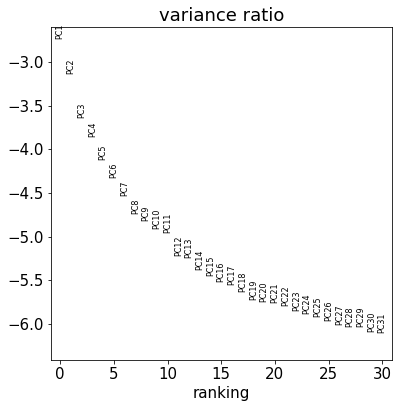

In [207]:
dc_adata=sc.pp.scale(dc_adata, max_value=10,copy=True)
sc.tl.pca(dc_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(dc_adata, log=True)

In [208]:
sc.pp.neighbors(dc_adata, n_neighbors=15, n_pcs=27)

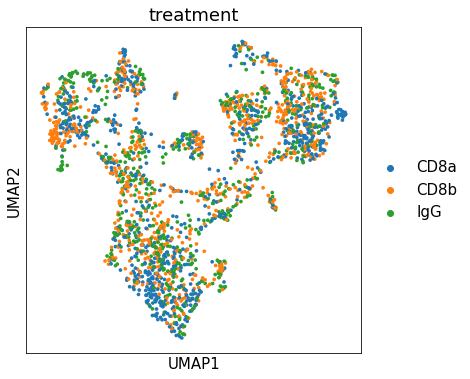

In [209]:
sc.tl.umap(dc_adata)
sc.pl.umap(dc_adata, color="treatment")

In [216]:
sc.tl.leiden(dc_adata,resolution=.5)

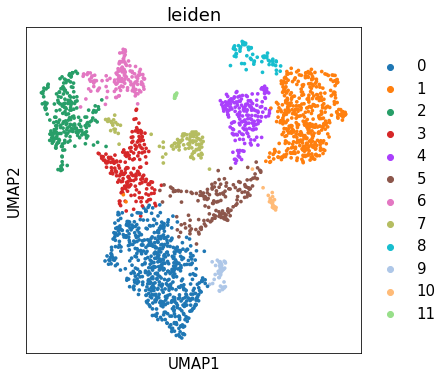

In [217]:
sc.pl.umap(dc_adata, color="leiden")

... storing 'dc_subclusters' as categorical


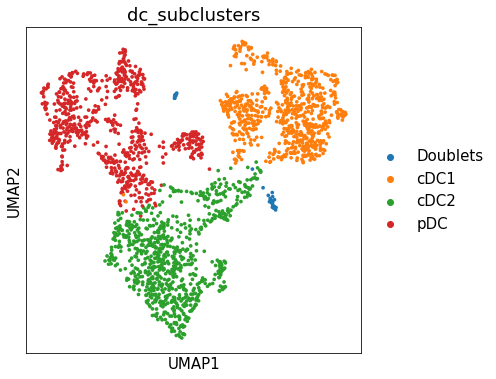

In [229]:
labels = {"0":"cDC2","1":"cDC1","2":"pDC","3":"pDC","4":"cDC1","5":"cDC2","6":"pDC","7":"pDC","8":"cDC1",
         "9":"cDC2","10":"Doublets","11":"Doublets"}
dc_adata.obs["dc_subclusters"] = dc_adata.obs["leiden"].map(labels)
sc.pl.umap(dc_adata, color="dc_subclusters")

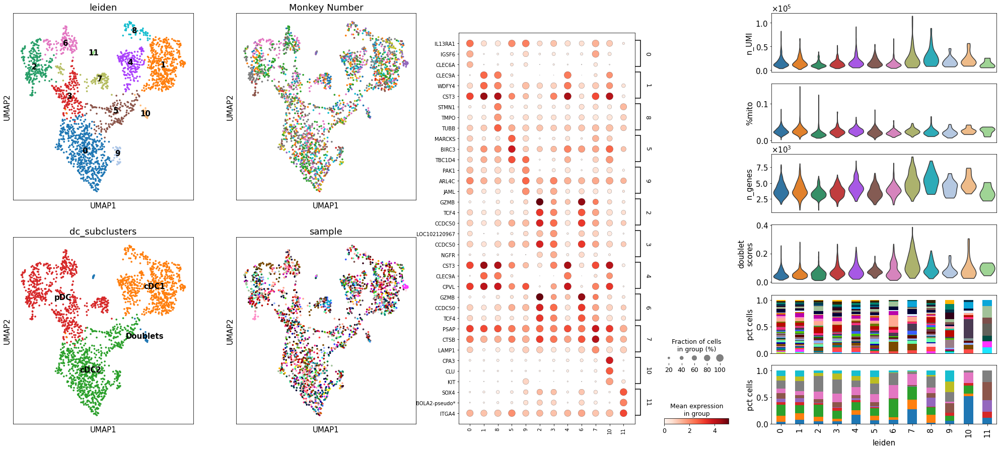

In [233]:
clusters_ordered_by_celltype=["0","1","8","5","9", #cDC
                              "2","3","4","6","7",#pDC
                              "10","11"]#doublet
                             
                              
fmp.clustering_qc_plots(dc_adata,clusters_ordered_by_celltype,"dc_subclusters")
plt.savefig("plots/gran_unfiltered_umaps/dc_cells_unfiltered_clustering_QC_plots.png",bbox_inches="tight")
plt.savefig("plots/gran_unfiltered_umaps/dc_cells_unfiltered_clustering_QC_plots.png",bbox_inches="tight")


In [234]:
propegate_labels_up(dc_adata, gran_adata, "dc_subclusters", "nodub subclusters")

In [236]:
propegate_labels_up(dc_adata, just_mac_adata, "dc_subclusters", "myeloid_clusts")

In [237]:
dc_adata.write_h5ad("analysis_objects/dc_unfiltered.h5ad")

# B and plasma cell clustering

In [41]:
b_adata = new_adata_from_raw(gran_adata, ["Plasma/B","B"],cluster_key="gran_celltypes")


In [42]:
b_adata.raw = b_adata
sc.pp.filter_genes(b_adata,min_cells=5)

In [43]:
sc.pp.highly_variable_genes(b_adata, n_top_genes=2000, batch_key="M.Number") # peaked at 256 GB in RAM for finding these genes
b_adata=b_adata[:,b_adata.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

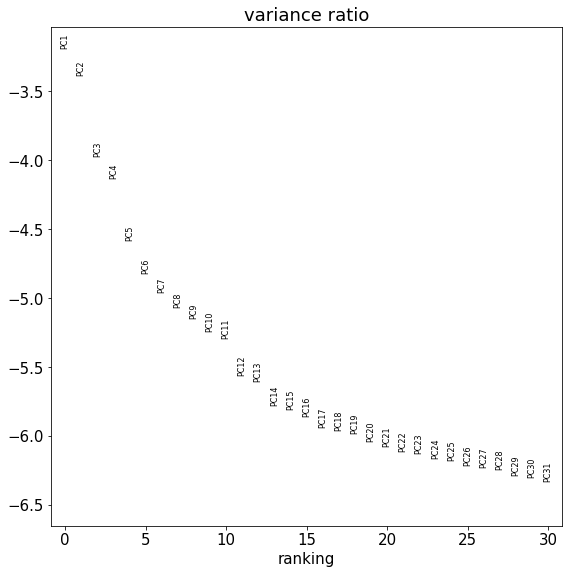

In [44]:
b_adata=sc.pp.scale(b_adata, max_value=10,copy=True)
sc.tl.pca(b_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(b_adata, log=True)

In [45]:
sc.pp.neighbors(b_adata, n_neighbors=15, n_pcs=23)

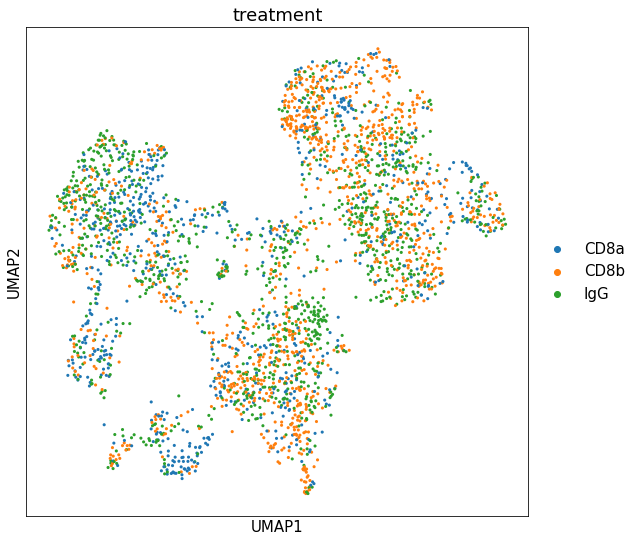

In [46]:
sc.tl.umap(b_adata)
sc.pl.umap(b_adata, color="treatment")

In [47]:
sc.tl.leiden(b_adata,resolution=1)

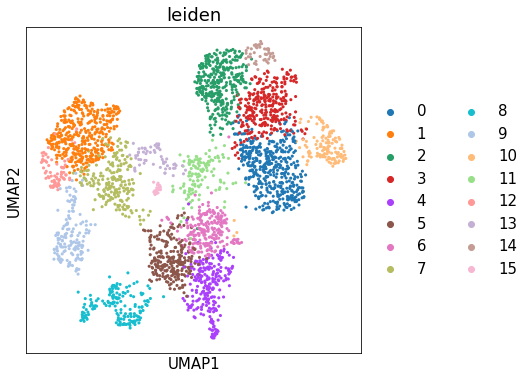

In [806]:
sc.pl.umap(b_adata, color="leiden")

In [807]:
sc.tl.rank_genes_groups(b_adata,groupby="leiden")
pd.DataFrame(b_adata.uns["rank_genes_groups"]["names"]).head(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,LOC102144039,MZB1,CD74,MS4A1,PTPRC,CD3D,ETS1,MZB1,MKI67,HSP90B1,MS4A1,LYZ,MZB1,SOD2,CD74,CPA3
1,MS4A1,SSR4,LOC102144039,LOC102144039,ETS1,LOC101925857,PTPRC,JCHAIN,STMN1,MZB1,LOC102144039,APOE,JCHAIN,LOC102147203,LOC102144039,CLU
2,CD74,HSP90B1,FCMR,CD74,PIK3R1,PTPRC,IFITM1,HSP90B1,LCP1,PDIA6,CD74,LOC102144039,HSP90B1,NFKBIA,CD83,FCER1A


/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'b_subclusters' as categorical


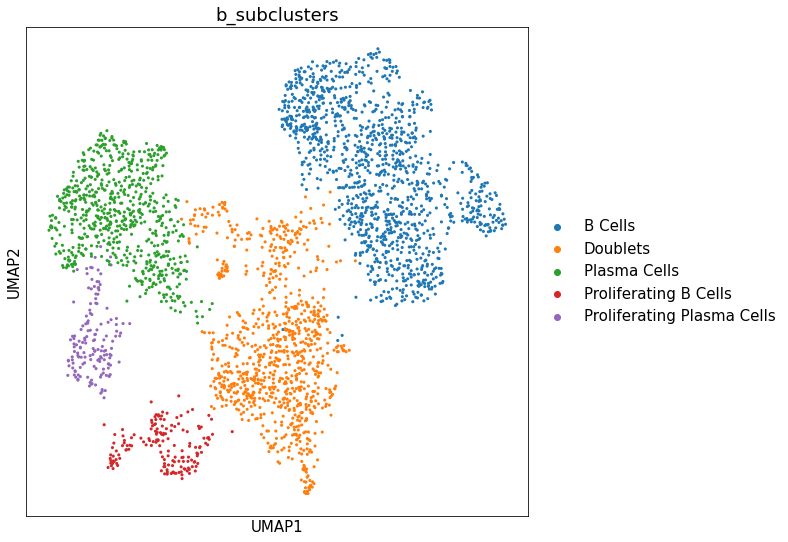

In [49]:
labels = {"0":"B Cells","1":"Plasma Cells","2":"B Cells","3":"B Cells","4":"Doublets","5":"Doublets","6":"Doublets","7":"Plasma Cells","8":"Proliferating B Cells",
         "9":"Proliferating Plasma Cells","10":"B Cells","11":"Doublets","12":"Plasma Cells",
         "13":"Doublets","14":"B Cells","15":"Doublets"}
b_adata.obs["b_subclusters"] = b_adata.obs["leiden"].map(labels)
sc.pl.umap(b_adata, color="b_subclusters")

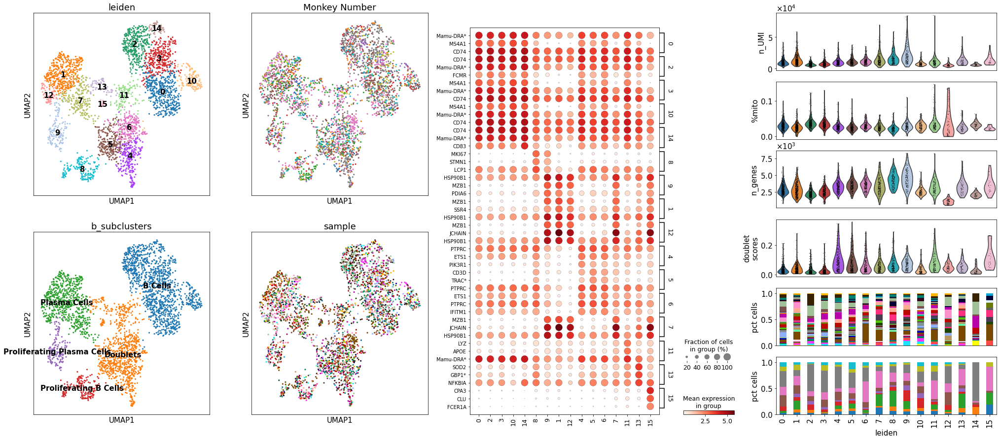

In [811]:
clusters_ordered_by_celltype=["0","2","3","10","14", #b
                              "8",#prolif b
                              "9",#prolifplasma
                             "1","12", #plasma
                              "4","5","6","7","11","13","15"]#doublet
                              
clustering_qc_plots(b_adata,clusters_ordered_by_celltype,"b_subclusters")
plt.savefig("plots/gran_unfiltered_umaps/b_cells_unfiltered_clustering_QC_plots.png",bbox_inches="tight")
plt.savefig("plots/gran_unfiltered_umaps/b_cells_unfiltered_clustering_QC_plots.png",bbox_inches="tight")


In [50]:
propegate_labels_up(b_adata, gran_adata, "b_subclusters", "nodub subclusters")

In [815]:
gran_adata.obs["gran_celltypes"].unique()

['Mac/Neutrophil/DC', 'Mast', 'Plasma/B', 'NonImmune', 'NK/T cells', 'B']
Categories (6, object): ['Mac/Neutrophil/DC', 'Mast', 'Plasma/B', 'NonImmune', 'NK/T cells', 'B']

In [51]:
b_adata.write_h5ad("analysis_objects/b_cells_unfiltered.h5ad")

# Nonimmune clustering

In [779]:
gran_adata.obs["gran_celltypes"].unique()

['Mac/Neutrophil/DC', 'Mast', 'Plasma/B', 'NonImmune', 'NK/T cells', 'B']
Categories (6, object): ['Mac/Neutrophil/DC', 'Mast', 'Plasma/B', 'NonImmune', 'NK/T cells', 'B']

In [52]:
noni_adata = new_adata_from_raw(gran_adata, ["NonImmune"],cluster_key="gran_celltypes")


/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [53]:
noni_adata.raw = noni_adata
sc.pp.filter_genes(noni_adata,min_cells=5)

In [54]:
sc.pp.highly_variable_genes(noni_adata, n_top_genes=2000, batch_key="M.Number") # peaked at 256 GB in RAM for finding these genes
noni_adata=noni_adata[:,noni_adata.var["highly_variable"]]

... storing 'nodub subclusters' as categorical
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version. 

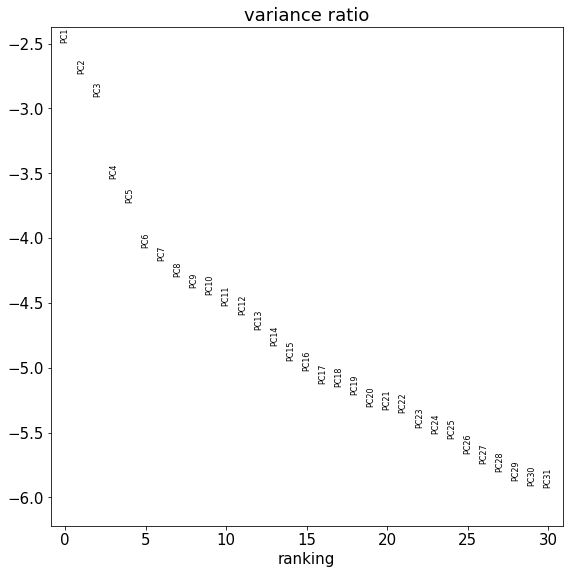

In [55]:
noni_adata=sc.pp.scale(noni_adata, max_value=10,copy=True)
sc.tl.pca(noni_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(noni_adata, log=True)

In [56]:
sc.pp.neighbors(noni_adata, n_neighbors=10, n_pcs=15)

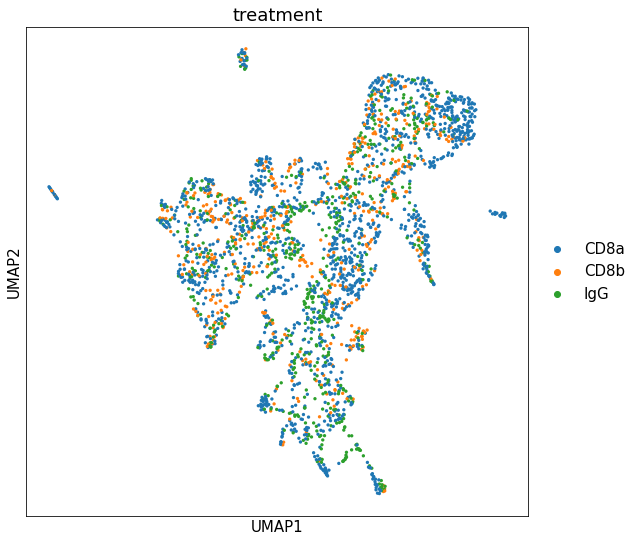

In [57]:
sc.tl.umap(noni_adata)
sc.pl.umap(noni_adata, color="treatment")

In [58]:
sc.tl.leiden(noni_adata,resolution=1)

In [111]:
sc.tl.rank_genes_groups(noni_adata,groupby="leiden")
pd.DataFrame(noni_adata.uns["rank_genes_groups"]["names"]).head(3)

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,LOC102119798,LYZ,SFTPD,LYZ,PTPRC,PTPRC,EPAS1,VWF,SRGN,COL6A3,...,SFTPB,MKI67,SFTPB,CPA3,LTBP1,PTPRB,MMRN1,DCN,PIGR,VMO1
1,SFTPC,LOC102122418,SFTPB,LOC102122418,ETS1,LCP1,ACVRL1,PECAM1,PECAM1,COL6A1,...,SFTPD,STMN1,SFTPD,FCER1A,DCN,PECAM1,RAMP2,CCDC80,SCGB3A1,TSPAN1
2,SFTPB,TYROBP,NPC2,CTSS,STK17B,CORO1A,RAMP3,RAMP2,PTPRC,COL3A1,...,LOC102119798,TOP2A,NPC2,SRGN,SPARCL1,RAMP2,PECAM1,COL6A2,SCGB1A1,EZR


In [108]:
labels = {"0":"T2P","1":"T2P","2":"T2P","3":"Fibroblasts","4":"Doublets","5":"Doublets","6":"Endothelial","7":"Endothelial","8":"Endothelial",
         "9":"Fibroblasts","10":"T1P","11":"Fibroblasts","12":"Endothelial",
         "13":"T2P","14":"Fibroblasts","15":"Doublets","16":"Endothelial","17":"Fibroblasts","18":"T2P",
         "19":"Doublets","20":"T2P","21":"Doublets","22":"Fibroblasts","23":"Endothelial","24":"Endothelial","25":"Fibroblasts","26":"Secretory","27":"Low Quality"}
noni_adata.obs["noni_subclusters"] = noni_adata.obs["leiden"].map(labels)

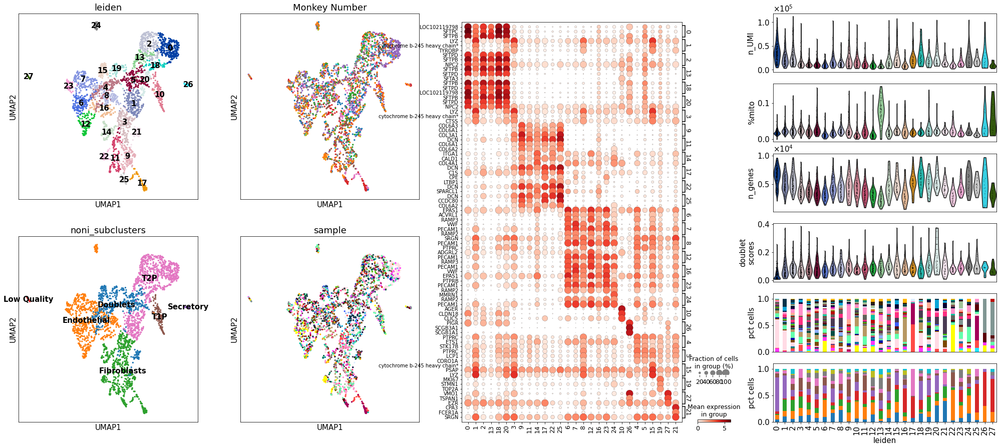

In [112]:
clusters_ordered_by_celltype=["0","1","2", "13","18","20",#t2p
                              "3","9","11","14","17","22","25",#fibro
                              "6","7","8","12","16","23","24",#endo
                             "10", #t1p
                              "26",#secretory
                              "4","5","15","19","27","21"]#doublet
                              
clustering_qc_plots(noni_adata,clusters_ordered_by_celltype,"noni_subclusters")
plt.savefig("plots/gran_unfiltered_umaps/nonimmune_unfiltered_clustering_QC_plots.png",bbox_inches="tight")
plt.savefig("plots/gran_unfiltered_umaps/nonimmune_unfiltered_clustering_QC_plots.png",bbox_inches="tight")


In [128]:
propegate_labels_up(noni_adata, gran_adata, "noni_subclusters", "nodub subclusters")
gran_adata.obs.loc[noni_adata[noni_adata.obs["leiden"]=="21"].obs_names, "gran_celltypes"] = "NonImmune"

In [114]:
noni_adata.write_h5ad("analysis_objects/nonimmune_unfiltered_adata.h5ad")

# Mast clustering

In [779]:
gran_adata.obs["gran_celltypes"].unique()

['Mac/Neutrophil/DC', 'Mast', 'Plasma/B', 'NonImmune', 'NK/T cells', 'B']
Categories (6, object): ['Mac/Neutrophil/DC', 'Mast', 'Plasma/B', 'NonImmune', 'NK/T cells', 'B']

In [129]:
mast_adata = new_adata_from_raw(gran_adata, ["Mast"],cluster_key="gran_celltypes")


In [130]:
mast_adata.raw = mast_adata
sc.pp.filter_genes(mast_adata,min_cells=5)

In [131]:
sc.pp.highly_variable_genes(mast_adata, n_top_genes=2000, batch_key="M.Number") # peaked at 256 GB in RAM for finding these genes
mast_adata=mast_adata[:,mast_adata.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'nodub subclusters' as categorical
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be remo

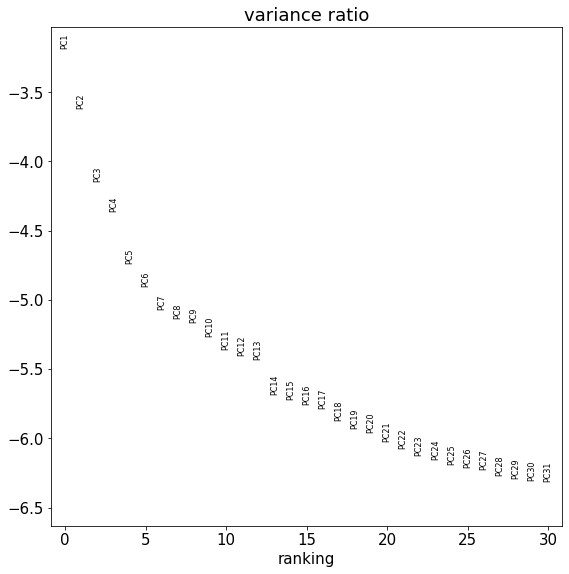

In [132]:
mast_adata=sc.pp.scale(mast_adata, max_value=10,copy=True)
sc.tl.pca(mast_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(mast_adata, log=True)

In [133]:
sc.pp.neighbors(mast_adata, n_neighbors=10, n_pcs=20)

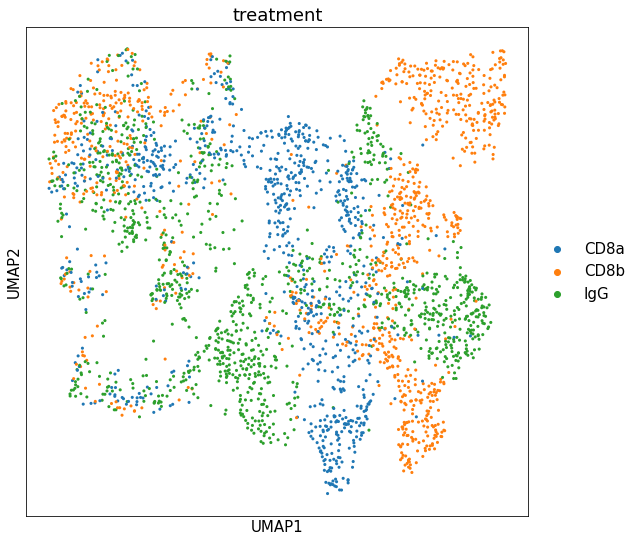

In [134]:
sc.tl.umap(mast_adata)
sc.pl.umap(mast_adata, color="treatment")

In [136]:
sc.tl.leiden(mast_adata,resolution=1)

In [138]:
sc.tl.rank_genes_groups(mast_adata,groupby="leiden")
pd.DataFrame(mast_adata.uns["rank_genes_groups"]["names"]).head(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,CD3D,TMEM176B,ND4,LOC102114865,FOSB,CPA3,LOC102139613,VMO1,ETS1,LMNA,LOC102139771,STMN1,LOC102144039,LOC102140229,CD74,SOD2,MKI67,LOC102141414,IFI6
1,ETS1,PRSS57,APOE,LMNA,EGR1,LOC102142222,FOS,LOC102140002,IFITM1,LOC102139613,LOC102143352,TUBB,CD74,LOC101867070,LOC102144039,LOC102147203,STMN1,LOC102142071,MX2
2,PTPRC,LOC102140002,ALOX5AP,EMILIN2,JUN,LOC102132408,CST3,PLXNC1,PTPRC,PPP1R15A,ARL5B,MKI67,LYZ,LMNA,MS4A1,CSF3R,CORO1A,PRSS57,OAS2


... storing 'mast_subclusters' as categorical


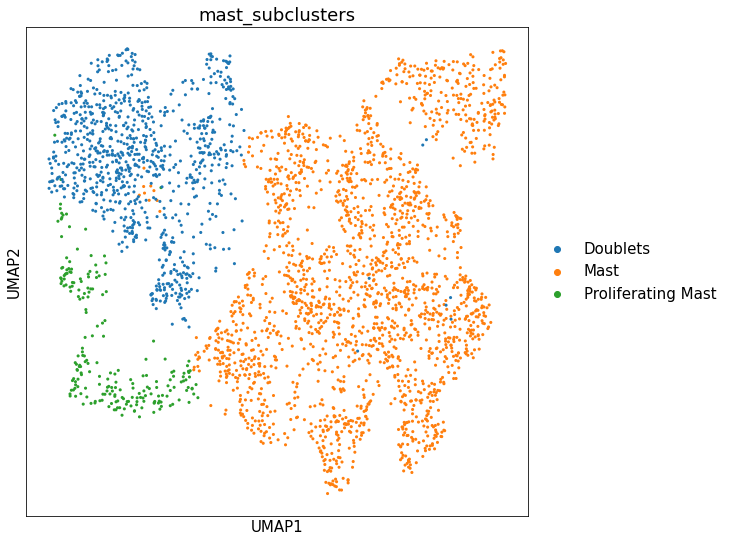

In [142]:
labels = {"0":"Doublets","1":"Mast","2":"Mast","3":"Mast","4":"Mast","5":"Mast","6":"Mast","7":"Mast","8":"Doublets",
         "9":"Mast","10":"Mast","11":"Proliferating Mast","12":"Doublets",
         "13":"Mast","14":"Doublets","15":"Doublets","16":"Proliferating Mast","17":"Mast","18":"Mast"}
mast_adata.obs["mast_subclusters"] = mast_adata.obs["leiden"].map(labels)
sc.pl.umap(mast_adata, color="mast_subclusters")

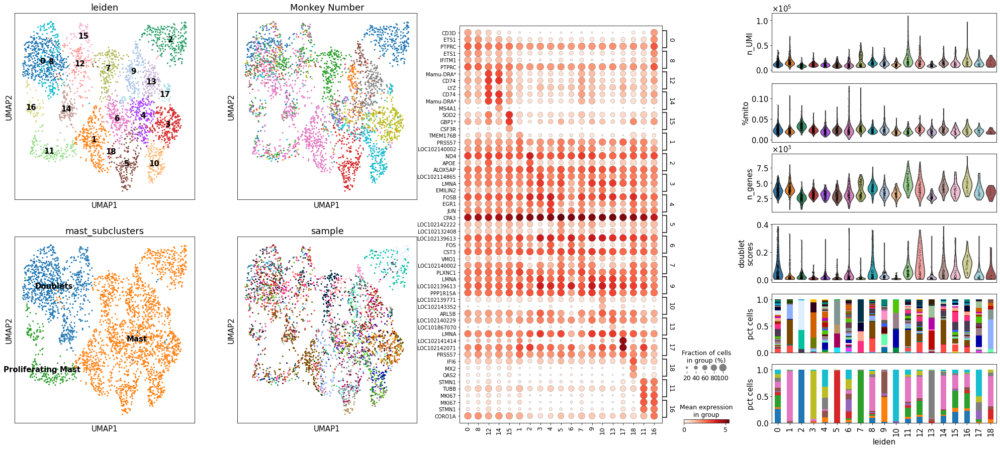

In [144]:
clusters_ordered_by_celltype=["0","8","12","14","15",#doublets
                              "1","2","3","4","5","6","7","9","10","13","17","18",#mast
                              "11","16"]# prolif mast
clustering_qc_plots(mast_adata,clusters_ordered_by_celltype,"mast_subclusters")
plt.savefig("plots/gran_unfiltered_umaps/mast_unfiltered_clustering_QC_plots.png",bbox_inches="tight")
plt.savefig("plots/gran_unfiltered_umaps/mast_unfiltered_clustering_QC_plots.png",bbox_inches="tight")


In [145]:
propegate_labels_up(mast_adata, gran_adata, "mast_subclusters", "nodub subclusters")


In [147]:
mast_adata.write_h5ad("analysis_objects/mast_unfiltered_adata.h5ad")

# visualize with doublets

In [6]:
gran_adata = sc.read_h5ad("analysis_objects/all_gran_countfiltered.h5ad")

... storing 'nodub subclusters' as categorical


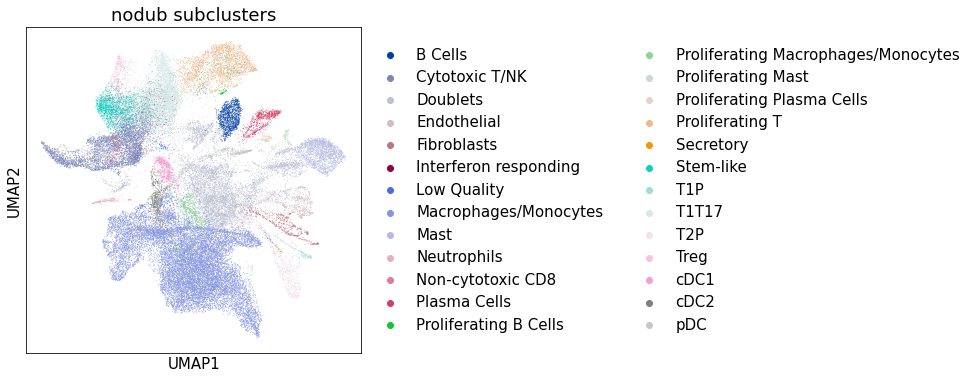

In [239]:
sc.pl.umap(gran_adata, color="nodub subclusters")

In [240]:

general_celltypes = {'Macrophages/Monocytes':'Macrophages/Monocytes',
 'Mast':'Mast',
 'Proliferating Mast':'Mast',
 'Proliferating Plasma Cells':'Plasma Cells',
"Proliferating Macrophages/Monocytes":'Macrophages/Monocytes',
 'Doublets':"Low Quality/Doublets",
 'T2P':"T2P",
 'cDC1':"cDC",
'cDC2':"cDC",
 'Plasma Cells':"Plasma Cells",
 'Proliferating T':"T/NK",
 'Cytotoxic T/NK':"T/NK",
 'Treg':"T/NK",
 'B Cells':"B Cells",
 'pDC':"pDC",
 'Low Quality':"Low Quality/Doublets",
 'T1T17':"T/NK",
 'Stem-like':"T/NK",
 'T1P':"T1P",
 'Endothelial':"Endothelial",
 'Fibroblasts':"Fibroblasts",
 'Proliferating B Cells':"B Cells",
 'Interferon responding':"T/NK",
 'Non-cytotoxic CD8':"T/NK",
 'Neutrophils':"Neutrophils",
 'Secretory':"Secretory Epithelial"}
gran_adata.obs["General Celltypes"] = gran_adata.obs["nodub subclusters"].map(general_celltypes)

... storing 'General Celltypes' as categorical


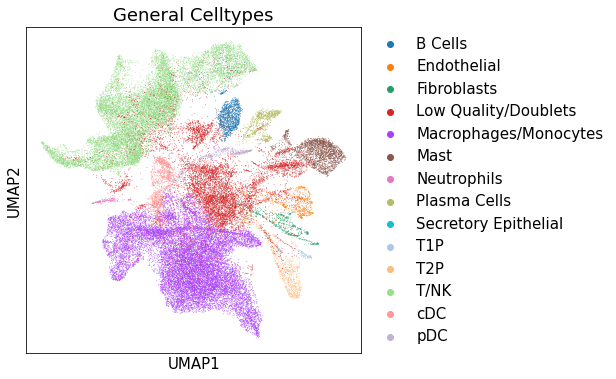

In [241]:
sc.pl.umap(gran_adata, color="General Celltypes")

... storing 'filtered at subclustering' as categorical


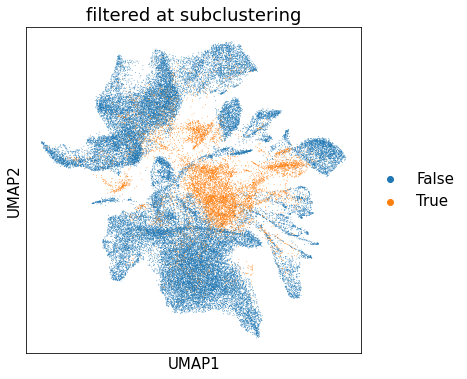

In [243]:
sc.pl.umap(gran_adata, color="filtered at subclustering")

In [242]:
gran_adata.obs["filtered at subclustering"] = "False"
gran_adata.obs.loc[gran_adata.obs["nodub subclusters"].isin(["Doublets","Low Quality"]),"filtered at subclustering"]="True"

In [244]:
gran_adata.write_h5ad("analysis_objects/all_gran_countfiltered.h5ad")

In [2]:
gran_adata=sc.read_h5ad("analysis_objects/all_gran_countfiltered.h5ad")

In [5]:
gran_adata.obs.groupby(["treatment_monkey_array","filtered at subclustering"]).count()["sample"].unstack().to_csv("tables/filtered_at_subclustering_by_array.csv")

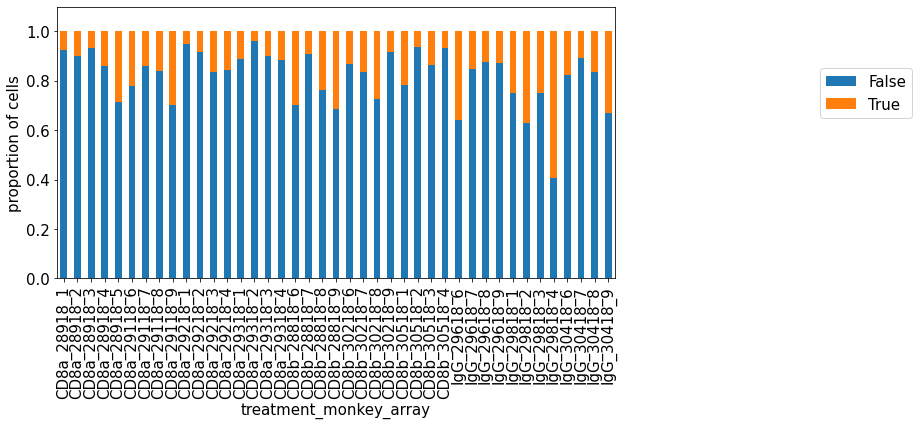

In [152]:
#stacked bar of scrublet doublets
fig,ax=plt.subplots(1,1,figsize=(10,5))

hh.normalized_stacked_bar_plot(gran_adata, x_value="treatment_monkey_array",color_value="filtered at subclustering",ax=ax)
plt.savefig("plots/QC/just_grans_subclustering_doublet_stacked_bar.pdf",bbox_inches="tight")
plt.savefig("plots/QC/just_grans_subclustering_doublet_stacked_bar.png",bbox_inches="tight")


In [12]:
gran_adata.obs.groupby(["treatment_monkey_array","filtered at subclustering"])["percent_mito"].mean().unstack().to_csv("tables/percent_mito_mean.csv")

In [13]:
gran_adata.obs.groupby(["treatment_monkey_array","filtered at subclustering"])["percent_mito"].std().unstack().to_csv("tables/percent_mito_std.csv")

In [14]:
gran_adata.obs.groupby(["treatment_monkey_array","filtered at subclustering"])["total_counts"].mean().unstack().to_csv("tables/total_counts_mean.csv")
gran_adata.obs.groupby(["treatment_monkey_array","filtered at subclustering"])["total_counts"].std().unstack().to_csv("tables/total_counts_std.csv")

In [15]:
gran_adata.obs.groupby(["treatment_monkey_array","filtered at subclustering"])["n_genes_by_counts"].mean().unstack().to_csv("tables/n_genes_by_counts_mean.csv")
gran_adata.obs.groupby(["treatment_monkey_array","filtered at subclustering"])["n_genes_by_counts"].std().unstack().to_csv("tables/n_genes_by_counts_std.csv")

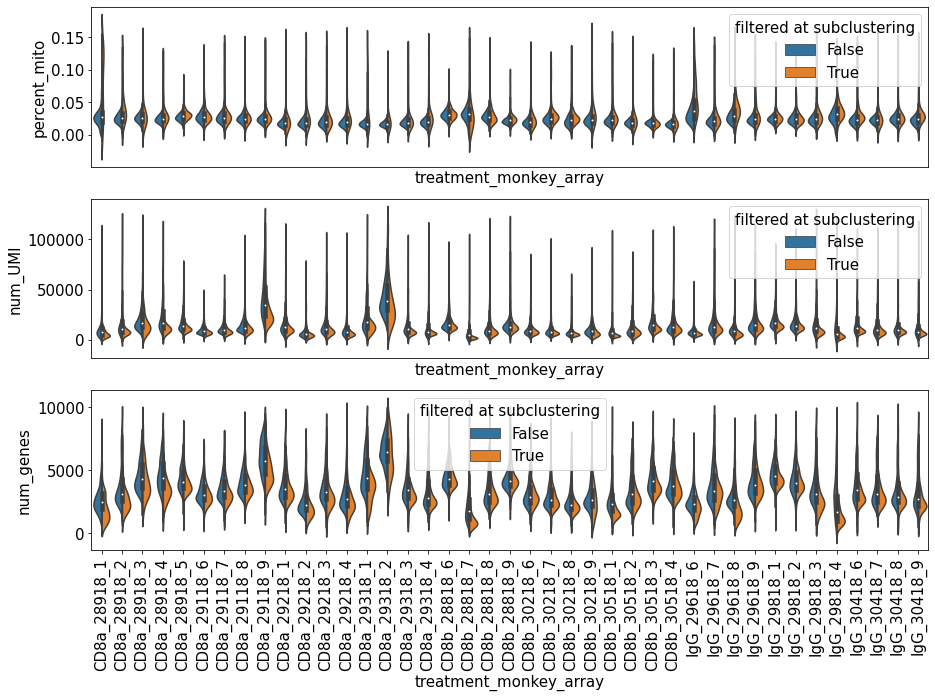

In [154]:
fig,ax=plt.subplots(3,1,figsize=(15,10))
sns.violinplot(x="treatment_monkey_array",y="percent_mito",hue="filtered at subclustering",data=gran_adata.obs,rotation=90,ax=ax[0],split=True)

ax[0].set_xticks([])

sns.violinplot(x="treatment_monkey_array",y="total_counts",hue="filtered at subclustering",data=gran_adata.obs,rotation=90,ax=ax[1],split=True)
ax[1].set_ylabel("num_UMI")
ax[1].set_xticks([])

sns.violinplot(x="treatment_monkey_array",y="n_genes_by_counts",hue="filtered at subclustering",data=gran_adata.obs,rotation=90,ax=ax[2],split=True)
ax[2].set_ylabel("num_genes")


for tick in ax[2].get_xticklabels():
    tick.set_rotation(90)
plt.savefig("plots/QC/just_grans_subclustering_QC_by_sample_splitby_subclust_doublet.pdf",bbox_inches="tight")
plt.savefig("plots/QC/just_grans_subclustering_QC_by_sample_splitby_subclust_doublet.png",bbox_inches="tight")

In [160]:
# make split QC plots from pre-filtering data

gran_concat_adata = concat_adata[concat_adata.obs["Gran State"].isin(["New","Old"])]

gran_concat_adata.obs["Filtered Out"] = "True"
gran_concat_adata.obs.loc[gran_adata[gran_adata.obs["filtered at subclustering"]=="False"].obs_names,"Filtered Out"]="False"



Trying to set attribute `.obs` of view, copying.


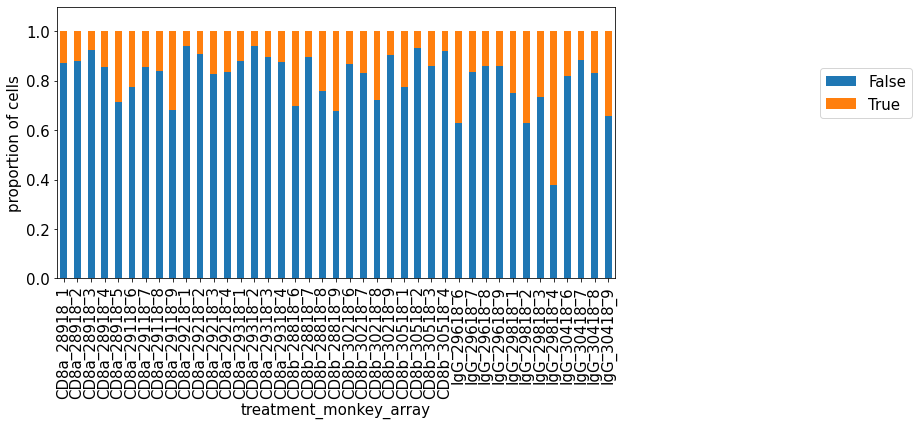

In [161]:
#stacked bar of scrublet doublets
fig,ax=plt.subplots(1,1,figsize=(10,5))

hh.normalized_stacked_bar_plot(gran_concat_adata, x_value="treatment_monkey_array",color_value="Filtered Out",ax=ax)
plt.savefig("plots/QC/just_grans_all_cells_filtered_out_stacked_bar.pdf",bbox_inches="tight")
plt.savefig("plots/QC/just_grans_all_cells_filtered_out_stacked_bar.png",bbox_inches="tight")


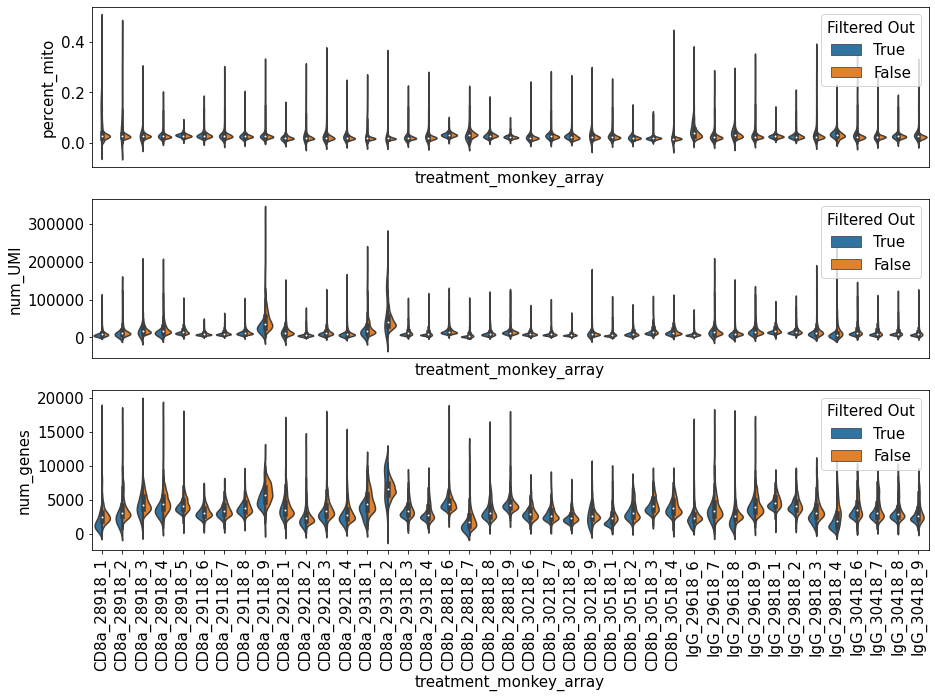

In [162]:
fig,ax=plt.subplots(3,1,figsize=(15,10))
sns.violinplot(x="treatment_monkey_array",y="percent_mito",hue="Filtered Out",data=gran_concat_adata.obs,rotation=90,ax=ax[0],split=True)

ax[0].set_xticks([])

sns.violinplot(x="treatment_monkey_array",y="total_counts",hue="Filtered Out",data=gran_concat_adata.obs,rotation=90,ax=ax[1],split=True)
ax[1].set_ylabel("num_UMI")
ax[1].set_xticks([])

sns.violinplot(x="treatment_monkey_array",y="n_genes_by_counts",hue="Filtered Out",data=gran_concat_adata.obs,rotation=90,ax=ax[2],split=True)
ax[2].set_ylabel("num_genes")


for tick in ax[2].get_xticklabels():
    tick.set_rotation(90)
plt.savefig("plots/QC/just_grans_all_cells_filtered_out_splitviolin.pdf",bbox_inches="tight")
plt.savefig("plots/QC/just_grans_all_cells_filtered_out_splitviolin.png",bbox_inches="tight")

# Make umap after filtering

In [245]:
nodub_adata = new_adata_from_raw(gran_adata,["False"],"filtered at subclustering" )

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [246]:
nodub_adata.raw = nodub_adata
sc.pp.filter_genes(nodub_adata,min_cells=5)

In [247]:
sc.pp.highly_variable_genes(nodub_adata, n_top_genes=3000, batch_key="M.Number") # peaked at 256 GB in RAM for finding these genes
nodub_adata=nodub_adata[:,nodub_adata.var["highly_variable"]]

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

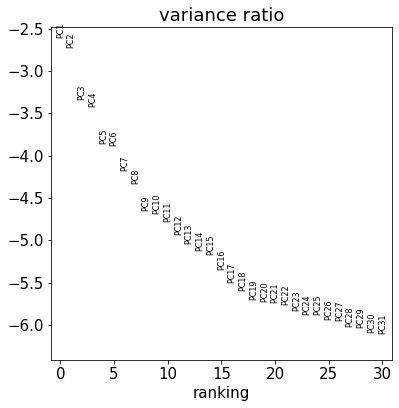

In [248]:
nodub_adata=sc.pp.scale(nodub_adata, max_value=10,copy=True)
sc.tl.pca(nodub_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(nodub_adata, log=True)

In [249]:
sc.pp.neighbors(nodub_adata, n_neighbors=15, n_pcs=20)

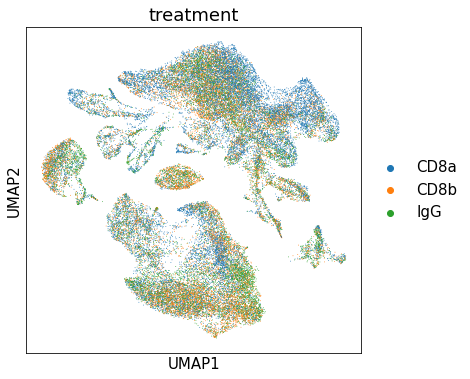

In [250]:
sc.tl.umap(nodub_adata)
sc.pl.umap(nodub_adata, color="treatment")

<AxesSubplot:title={'center':'General Celltypes'}, xlabel='UMAP1', ylabel='UMAP2'>

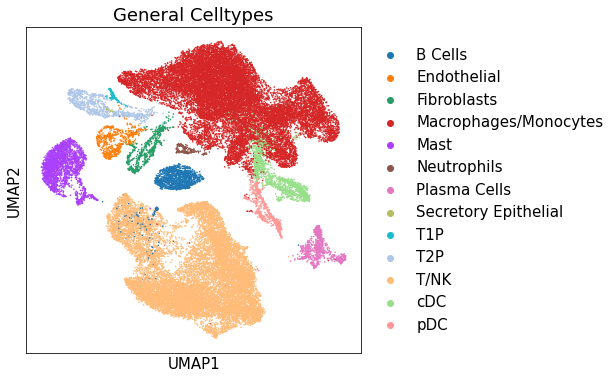

In [251]:
sc.pl.umap(nodub_adata, color="General Celltypes",size=10,show=False)
#plt.savefig("plots/all_cells_figure/umap_general_celltypes.pdf",bbox_inches="tight")
#plt.savefig("plots/all_cells_figure/umap_general_celltypes.png",bbox_inches="tight")

In [66]:
plt.rcParams["figure.figsize"]=(6,6)


/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:370: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  **kwargs,


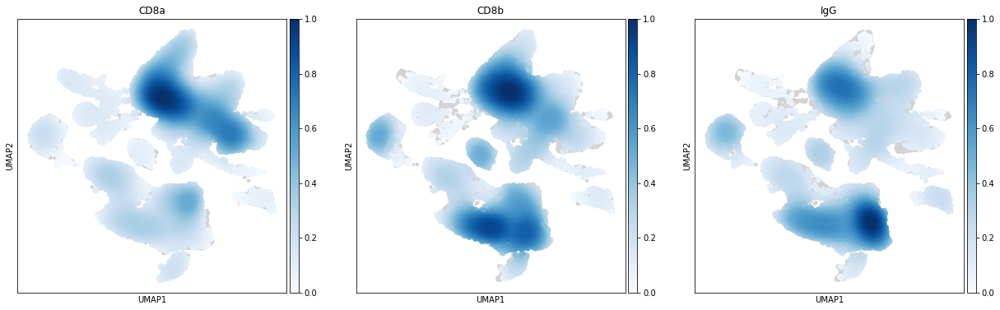

<Figure size 432x432 with 0 Axes>

In [20]:
sc.tl.embedding_density(nodub_adata, groupby='treatment',basis="umap")
#plt.rcParams["figure.figsize"]=(6,6)

sc.pl.embedding_density(nodub_adata, groupby='treatment',basis="umap",color_map="Blues")
plt.savefig("plots/all_cells_figure/treatment_embedding_density.pdf",bbox_inches="tight")
plt.savefig("plots/all_cells_figure/treatment_embedding_density.png",bbox_inches="tight")



In [67]:
sc.tl.rank_genes_groups(nodub_adata,groupby="General Celltypes",pts=True)

In [14]:
sc.tl.filter_rank_genes_groups(nodub_adata,min_in_group_fraction=.6,max_out_group_fraction=.7)

In [438]:
ph.save_filtered_rankgenesgroups(nodub_adata,"tables/differential_genes/all_cells/")

In [15]:
pd.DataFrame(nodub_adata.uns["rank_genes_groups_filtered"]["names"]).head(3)

,B Cells,Endothelial,Fibroblasts,Macrophages/Monocytes,Mast,Neutrophils,Plasma Cells,Secretory Epithelial,T1P,T2P,T/NK,cDC,pDC
0,MS4A1,PTRF,DCN,LOC102122418,CPA3,NaN,MZB1,PIGR,AGER,SFTPB,ETS1,NaN,GZMB
1,BANK1,NaN,COL1A2,LYZ,CLU,NaN,JCHAIN,WFDC2,CLDN18,SFTPD,CD3D,NaN,CCDC50
2,CD19,SPTBN1,COL3A1,IFI30,MS4A2,FCGR2B,NaN,SCGB3A1,EMP2,NPC2,IFITM1,NaN,TCF4


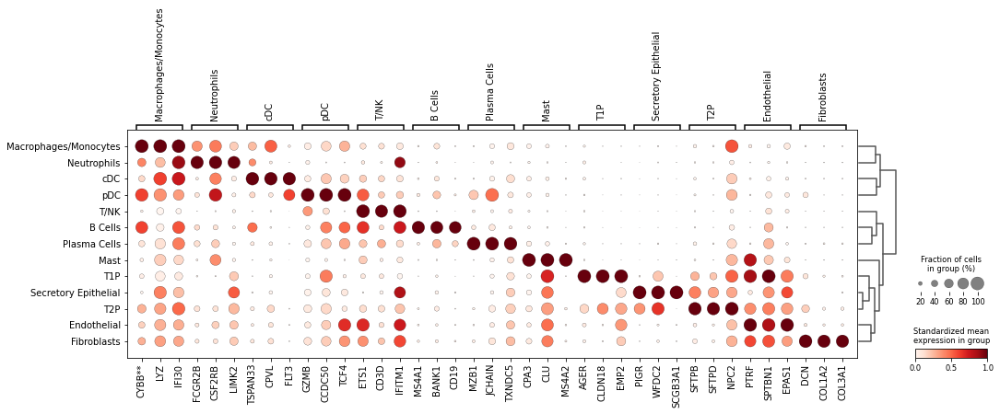

In [17]:
# when you re-runthis from reading from file, you need to re-run the filtering step because when it reads it in it reads nans as strings which confuses this function
ax=sc.pl.rank_genes_groups_dotplot(nodub_adata,groupby="General Celltypes",n_genes=3,show=False,key="rank_genes_groups_filtered",standard_scale="var",colorbar_title='Standardized mean\nexpression in group')

ph.replace_rankgenesgroups_dotplot_locs(ax)

plt.savefig("plots/all_cells_figure/dotplot_general_celltypes.pdf",bbox_inches="tight")
plt.savefig("plots/all_cells_figure/dotplot_general_celltypes.png",bbox_inches="tight")


In [36]:
nodub_adata.uns['rank_genes_groups']

{'logfoldchanges': array([( 8.192861 ,  5.783858 ,  8.937901 ,  5.6294484, 10.043784,   3.9336627,  8.336716 ,  10.660016,  10.99007 , 10.250766 ,  4.3166084,  3.090228 ,   6.4129615),
        ( 5.4558997,  3.6373012,  9.991026 ,  5.7882967,  8.229095,   4.326773 ,  9.867019 ,   9.296539,  10.276149, 10.078757 ,  4.6044264,  3.080989 ,   5.2991414),
        ( 7.3963785,  5.024705 ,  9.816209 ,  4.547473 ,  9.671759,   4.2251782,  3.2855973,  14.885459,   9.706549,  3.7575088,  3.5204527,  3.0194783,   4.749439 ),
        ...,
        (-5.666361 , -2.8454142, -2.0728896, -3.4979196, -4.647374, -27.487677 , -4.262527 , -29.936905, -28.314827, -2.6288075, -5.4165287, -2.5834513,  -5.340007 ),
        (-4.8986173, -3.3677297, -2.6180136, -3.3500073, -4.704282, -28.016037 , -4.425169 , -30.10982 ,  -8.389525, -2.7516384, -6.0783334, -2.2075348, -25.823988 ),
        (-5.844447 , -2.9214523, -2.156879 , -3.9788258, -4.860243, -27.984009 , -4.539603 , -30.561022, -29.324604, -2.734678 , -5.41

/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/afs/csail.mit.edu/u/n/nyquist/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_c

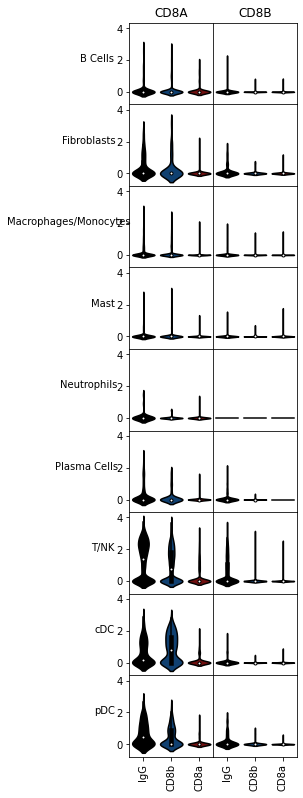

In [11]:
genenames = {"CD8A":"CD8A","CD8B":"CD8B"}
ph.condition_split_violin(nodub_adata[nodub_adata.obs["General Celltypes"].isin(["pDC","cDC","T/NK","Macrophages/Monocytes","Neutrophils","B Cells","Plasma Cells","Mast","Fibroblasts"])], "treatment","General Celltypes",genenames,violin_order=["IgG","CD8b","CD8a"])


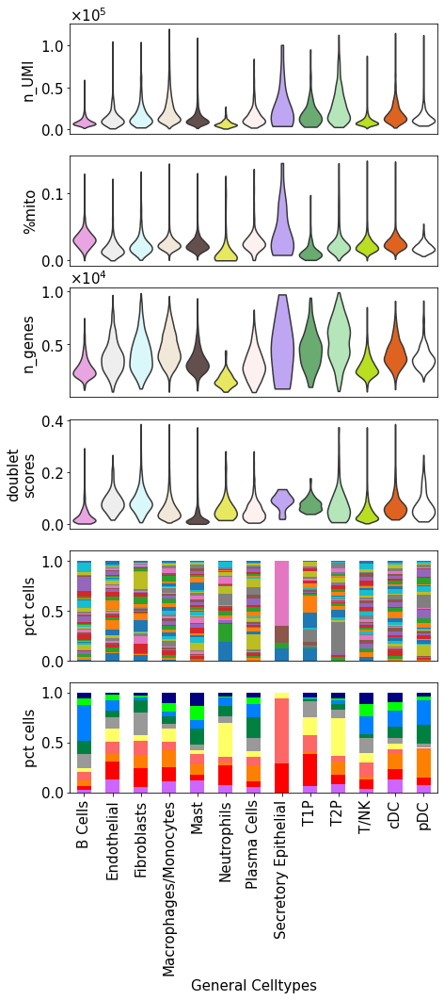

In [700]:
fmp.qcplots(nodub_adata,groupby="General Celltypes")

In [252]:
nodub_adata.write_h5ad("analysis_objects/all_grans_nodubs.h5ad")

In [16]:
nodub_adata=sc.read_h5ad("analysis_objects/all_grans_nodubs.h5ad")

In [30]:
qc_info = pd.DataFrame(columns = ["number of cells","Mean % mitochondrial genes", "Standard Deviation % mitochondrial genes",
                                 "Mean number of UMI per cell", "Standard Deviation number of UMI per cell",
                                 "Mean number of genes per cell", "Standard Deviation number of genes per cell"],
                      index=nodub_adata.obs["General Celltypes"].unique())

In [31]:
qc_info["number of cells"] = nodub_adata.obs.groupby(["General Celltypes"]).count()["percent_mito"]

In [32]:
qc_info["Mean % mitochondrial genes"]=nodub_adata.obs.groupby(["General Celltypes"])["percent_mito"].mean()

In [33]:
qc_info["Standard Deviation % mitochondrial genes"] = nodub_adata.obs.groupby(["General Celltypes"])["percent_mito"].std()

In [34]:
qc_info["Mean number of UMI per cell"]=nodub_adata.obs.groupby(["General Celltypes"])["total_counts"].mean()
qc_info["Standard Deviation number of UMI per cell"]=nodub_adata.obs.groupby(["General Celltypes"])["total_counts"].std()

In [35]:
qc_info["Mean number of genes per cell"] = nodub_adata.obs.groupby(["General Celltypes"])["n_genes_by_counts"].mean()
qc_info["Standard Deviation number of genes per cell"] =nodub_adata.obs.groupby(["General Celltypes"])["n_genes_by_counts"].std()

In [36]:
qc_info.to_csv("tables/general_celltype_qc_info.csv")

In [253]:
celltype_counts = nodub_adata.obs.groupby(["sample","General Celltypes"])["General Celltypes"].count().unstack("General Celltypes").fillna(0)

In [254]:
celltype_counts.to_csv("tables/major_cell_cluster_counts_by_sample.csv")

In [642]:
celltype_proportions = celltype_counts.divide(celltype_counts.sum(axis=1),axis=0)

In [614]:
celltype_meta = pd.read_csv("tables/metadata_by_sample.csv",index_col=0)

In [643]:
celltype_proportions.columns = celltype_proportions.columns.astype(str)
#celltype_proportions["M.Number"] = celltype_meta.loc[celltype_proportions.index,"M.Number"]
celltype_proportions["treatment"] = celltype_meta["treatment"]

In [646]:
celltype_proportions.groupby(['treatment']).mean()#.sum(axis=1)

General Celltypes,B Cells,Endothelial,Fibroblasts,Macrophages/Monocytes,Mast,Neutrophils,Plasma Cells,Secretory Epithelial,T1P,T2P,T/NK,cDC,pDC
treatment,,,,,,,,,,,,,
CD8a,0.016102,0.018062,0.015897,0.542549,0.037138,0.006531,0.015047,0.001019,0.004111,0.026914,0.290881,0.017551,0.008197
CD8b,0.046768,0.013990,0.005602,0.419442,0.066765,0.003769,0.014766,0.000000,0.001250,0.012514,0.376597,0.026998,0.011539
IgG,0.050401,0.014135,0.018125,0.327543,0.077722,0.007932,0.036552,0.000000,0.001806,0.011870,0.420857,0.020397,0.012659


In [647]:
celltype_proportions.groupby(['treatment']).std()

General Celltypes,B Cells,Endothelial,Fibroblasts,Macrophages/Monocytes,Mast,Neutrophils,Plasma Cells,Secretory Epithelial,T1P,T2P,T/NK,cDC,pDC
treatment,,,,,,,,,,,,,
CD8a,0.011540,0.015613,0.017389,0.204169,0.031257,0.011153,0.012658,0.002789,0.006012,0.045034,0.224653,0.010842,0.011758
CD8b,0.052354,0.015138,0.004431,0.235047,0.051635,0.007125,0.013400,0.000000,0.001606,0.010831,0.219251,0.015668,0.010393
IgG,0.041668,0.011415,0.029060,0.173414,0.057800,0.020156,0.042835,0.000000,0.002158,0.013116,0.194295,0.009756,0.016485


In [256]:
major_pseudobulk_counts = fmp.save_pseudobulk_counts(concat_adata,nodub_adata.obs,"General Celltypes")



In [257]:
major_pseudobulk_counts.to_csv("analysis_objects/major_celltype_pooled_expression_by_sample.csv")


In [4]:
major_pseudobulk_counts=pd.read_csv("analysis_objects/major_celltype_pooled_expression_by_sample.csv",index_col=0)
major_meta=pd.read_csv("analysis_objects/major_celltype_pooled_metadata.csv",index_col=0)

In [19]:
pseudobulk_cnts =major_pseudobulk_counts.loc[major_meta.index]
pseudobulk_cnts["sample"] = major_meta["sample"]
pseudobulk_cnts.groupby("sample").sum().to_csv("analysis_objects/pseudobulk_by_sample.csv")

In [259]:
nodub_adata.obs["M.Number"] = nodub_adata.obs["M.Number"].astype(str)

In [260]:
nodub_adata.obs["monkey_condition_categories"] = nodub_adata.obs["M.Number"].map({"28918":"1","29218":"2","29318":"3","29118":"4","30518":"1","28818":"2","30218":"3","29818":"1","29618":"2","30418":"3"})

In [262]:
major_meta = fmp.save_metadata_for_pseudobulk_deseq(nodub_adata.obs[['sample','M.Number', 'treatment','Gran State',"monkey_condition_categories","General Celltypes"]],"General Celltypes",cell_counts=True)

/data/cb/scratch/nyquist/deeper_sequencing_analysis/figure_making_plots.py:307: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  processed_metadata[grp_name] = [processed_metadata.loc[i,celltype_col]+"_"+processed_metadata.loc[i,sample_col] for i in processed_metadata.index]
/data/cb/scratch/nyquist/deeper_sequencing_analysis/figure_making_plots.py:315: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  processed_metadata[c] = processed_metadata[c].astype(str)


In [263]:
major_meta.to_csv("analysis_objects/major_celltype_pooled_metadata.csv")